In [1]:
#initializing workspace
import pandas as pd
import matplotlib.pyplot as plt
import trxtools as tt
import os
from pyCRAC.Parsers import GTF2
import pyBigWig
import numpy as np
from trxtools.BigWig import *
from scipy.signal import argrelextrema

pathTAB = "../seq_references/Saccharomyces_cerevisiae.EF4.74.dna.toplevel.shortChrNames.tab"
pathGTF = "../seq_references/Saccharomyces_cerevisiae.EF4.74.shortChNames_with_PolIII_transcripts_extended_slop_intergenic_sort.gtf"
gtf = GTF2.Parse_GTF()
gtf.read_GTF(pathGTF)
gtf.read_TAB(pathTAB)

sequences = pd.read_csv(pathTAB, sep='\t',names=['chr','sequence'],index_col=0)
chr_len = sequences['sequence'].str.len()

pathDir = "../04_BigWig/"
pathMeta = "../06_metadata/"

dinucleotides = pd.read_csv(pathMeta+'/properties_of_dinucleotides.csv', index_col=0)
dinucleotides.index = dinucleotides.reset_index().index.astype(str)+"_"+dinucleotides.index

cleavage_sites = {"5' end" : (300),
                   'A0' : (300+609),
                   'A1' : (300+700),
                   'D'  : (300+2500),
                   'A2' : (300+2712),
                   'A3' : (300+2784),
                   'B1L': (300+2855),
                   'B1S': (300+2861),
                   'E'  : (300+3019),
                   'C1' : (300+3251),
                   'B2' : (300+6647),
                   'B0-1' : (300+6661),
                   'B0-2' : (300+6697),
                   'T1' : (300+6739)}

print(gtf.strand("RDN37-1"), gtf.chromosome("RDN37-1"), gtf.chromosomeCoordinates("RDN37-1"))
print(gtf.strand("RDN37-2"), gtf.chromosome("RDN37-2"), gtf.chromosomeCoordinates("RDN37-2"))

/home/tturowski/TurowskiLab/trxtools/trxtools/profiles.py:220: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  def binCollect3(s1=pd.Series(), lengths=[500,72,500], bins=[50, 10, 50]):
/home/tturowski/TurowskiLab/trxtools/trxtools/plotting.py:686: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  def plotAndFolding(df=pd.DataFrame(),dG=pd.Series(), title="", start=None, stop=None,


- chrXII (451785, 457732)
- chrXII (460922, 466869)


In [2]:
def polyA_reads(df_raw_all=pd.DataFrame(), df_raw_polyA=pd.DataFrame(),
                let_in=[], let_out=['wont find this string'],
                count=False):
    
    raw = tt.profiles.preprocess(df_raw_all,let_in=let_in, 
                                     let_out=let_out,stats=False, 
                                     smooth=False,pseudocounts_param=False, ntotal_param=False)
    polyA = tt.profiles.preprocess(df_raw_polyA,let_in=let_in, 
                                     let_out=let_out,stats=False, 
                                     smooth=False,pseudocounts_param=False, ntotal_param=False)
    
    polyA.columns = [i.replace("_polyA","") for i in polyA.columns]
    
    percentage = polyA.sum() / raw.sum()

    fraction_polyA = polyA / raw

    output = tt.profiles.preprocess(fraction_polyA.fillna(0.0),let_in=let_in, 
                                     let_out=let_out,stats=True,
                                     smooth=True,pseudocounts_param=False, ntotal_param=False)

    if count==True:
                return percentage, output
    
    elif count==False:
                print("Fraxction of polyA reads in the dataset:")
                print(percentage)
                return output

# Loading all datasets

In [3]:
flank = 1000

seq1_flank = tt.methods.reverse_complement(sequences.loc['chrXII'][0][451785-flank:457732+flank])
seq2_flank = tt.methods.reverse_complement(sequences.loc['chrXII'][0][460922-flank:466869+flank])

#loading datasets

data_files_3end = [f for f in os.listdir(pathDir) if 'PROFILE_3end' in f and "polyA" not in f and "bw" in f]
data_files_5end = [f for f in os.listdir(pathDir) if 'PROFILE_5end' in f and "polyA" not in f and "bw" in f]
data_files_polyA = [f for f in os.listdir(pathDir) if 'PROFILE_3end' in f and "polyA" in f and "bw" in f]

print(len(os.listdir(pathDir)))

print(len(data_files_3end))
print(len(data_files_5end))
print(len(data_files_polyA))

df01a_RDN371_datasets_3end = geneFromBigWig(gene_name="RDN37-1", data_path=pathDir, data_files=data_files_3end, gtf=gtf,ranges=flank)
s1_RDN371_sequence = df01a_RDN371_datasets_3end['nucleotide'] #kee[ for future use
df01b_RDN372_datasets_3end = geneFromBigWig(gene_name="RDN37-2", data_path=pathDir, data_files=data_files_3end, gtf=gtf,ranges=flank)
df01_RDN37_3end = df01a_RDN371_datasets_3end.drop('nucleotide',axis='columns') + df01b_RDN372_datasets_3end.drop('nucleotide',axis='columns')

df02a_RDN371_datasets_5end = geneFromBigWig(gene_name="RDN37-1", data_path=pathDir, data_files=data_files_5end, gtf=gtf,ranges=flank)
df02b_RDN372_datasets_5end = geneFromBigWig(gene_name="RDN37-2", data_path=pathDir, data_files=data_files_5end, gtf=gtf,ranges=flank)
df02_RDN37_5end = df02a_RDN371_datasets_5end.drop('nucleotide',axis='columns') + df02b_RDN372_datasets_5end.drop('nucleotide',axis='columns')

df03a_RDN371_datasets_polyA = geneFromBigWig(gene_name="RDN37-1", data_path=pathDir, data_files=data_files_polyA, gtf=gtf,ranges=flank)
df03b_RDN372_datasets_polyA = geneFromBigWig(gene_name="RDN37-2", data_path=pathDir, data_files=data_files_polyA, gtf=gtf,ranges=flank)
df03_RDN37_polyA = df03a_RDN371_datasets_polyA.drop('nucleotide',axis='columns') + df03b_RDN372_datasets_polyA.drop('nucleotide',axis='columns')

2519
438
438
438


/home/tturowski/TurowskiLab/trxtools/trxtools/BigWig.py:62: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_t1[name] = getSeqData(gene_name, data_path, name, gtf, ranges=ranges)
/home/tturowski/TurowskiLab/trxtools/trxtools/BigWig.py:62: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_t1[name] = getSeqData(gene_name, data_path, name, gtf, ranges=ranges)
/home/tturowski/TurowskiLab/trxtools/trxtools/BigWig.py:62: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

# Rpa190

Experiments: 
['XX000000_Rpa190HTP_wt_none_5_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_3_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_2_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_6_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_4_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_1_PROFILE_3end']


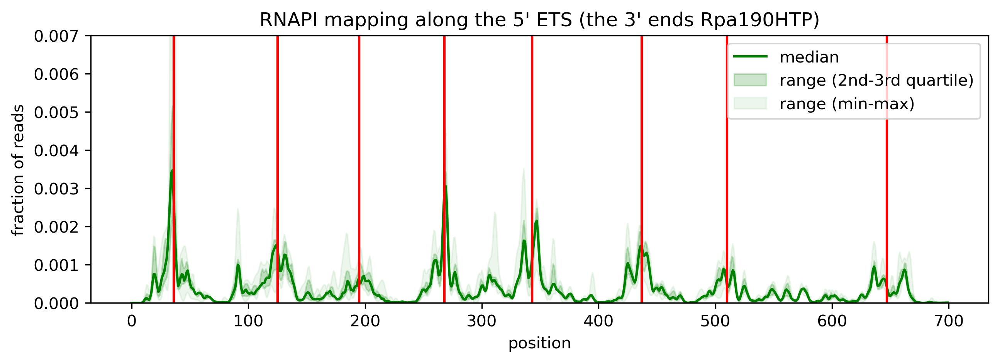

Experiments: 
['XX000000_Rpa190HTP_wt_none_5_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_3_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_2_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_6_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_4_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_1_PROFILE_3end']
Experiments: 
['XX000000_Rpa190HTP_wt_none_5_PROFILE_3end_polyA', 'XX000000_Rpa190HTP_wt_none_1_PROFILE_3end_polyA', 'XX000000_Rpa190HTP_wt_none_2_PROFILE_3end_polyA', 'XX000000_Rpa190HTP_wt_none_4_PROFILE_3end_polyA', 'XX000000_Rpa190HTP_wt_none_6_PROFILE_3end_polyA', 'XX000000_Rpa190HTP_wt_none_3_PROFILE_3end_polyA']
Experiments: 
['XX000000_Rpa190HTP_wt_none_1_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_2_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_3_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_4_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_5_PROFILE_3end', 'XX000000_Rpa190HTP_wt_none_6_PROFILE_3end']
Fraxction of polyA reads in the dataset:
XX000000_Rpa190HTP_wt_none_1_PROFILE_3end    0.024320
XX000000_Rpa19

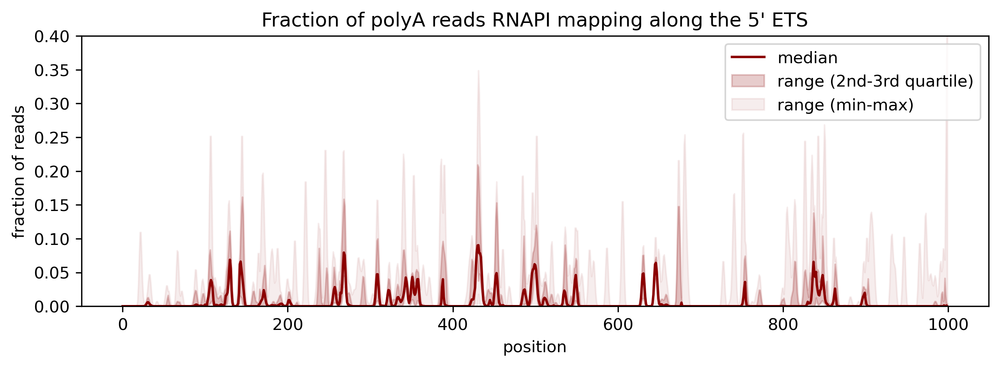

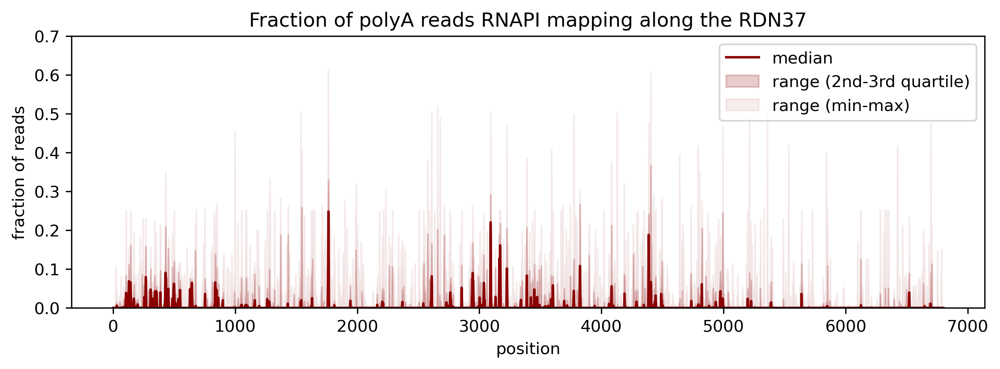

In [4]:
df11_Rpa190_3end = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP'], 
                                     let_out=['hmo1','0s','25rDNA','UVA',
                                              'Rnt1','rrp44','trf4','air1','rat1',
                                              'h_','C_'],stats=True)

# PEAKS
peaks = tt.profiles.findPeaks(df11_Rpa190_3end['median'][:7200],order=45,window=80)
# print(peaks)

tt.plotting.plot_as_box_plot(df11_Rpa190_3end, title="RNAPI mapping along the 5' ETS (the 3' ends Rpa190HTP)",
                             dpi=300,ylim=(None,0.007), start=0+300, stop=700+300,figsize=(10,3),
                             h_lines=[i-300 for i in peaks],offset=300)

# peaks_old = [336, 425, 495, 568, 643, 737, 810, 947, 1094, 1169, 1372, 1502, 1561, 1724, 1827, 1902, 2049, 2123, 2249, 2347, 2500, 2598, 2686, 2789, 2908, 2977, 3074, 3258, 3339, 3472, 3640, 3795, 3903, 4018, 4103, 4282, 4363, 4497, 4578, 4650, 4769, 4910, 5041, 5102, 5157, 5237, 5416, 5686, 5752, 5873, 5938, 6107, 6224, 6323, 6495, 6594, 6697, 6796, 6910, 7027]
# print(peaks_old==peaks) #True


# polyA reads

df14_Rpa190_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP'],
                                let_out=['hmo1','0s','25rDNA','UVA',
                                         'Rnt1','rrp44','trf4','air1','rat1',
                                         'h_','C_'],
                                         count=False)

# df12_Rpa190_3end_raw = tt.profiles.preprocess(df01_RDN37_3end,let_in=['Rpa190HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA',
#                                               'Rnt1','rrp44','trf4','air1','rat1'],stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df13_Rpa190_3end_polyA_raw = tt.profiles.preprocess(df03_RDN37_polyA,let_in=['Rpa190HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA',
#                                               'Rnt1','rrp44','trf4','air1','rat1'],stats=False,
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df13_Rpa190_3end_polyA_raw.columns = [i.replace("_polyA","") for i in df13_Rpa190_3end_polyA_raw.columns]

# df14_Rpa190_fractionPolyA = df13_Rpa190_3end_polyA_raw / df12_Rpa190_3end_raw

# df14_Rpa190_polyA = tt.profiles.preprocess(df14_Rpa190_fractionPolyA.fillna(0.0),let_in=['Rpa190HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA',
#                                               'Rnt1','rrp44','trf4','air1','rat1'],stats=True,
#                                      smooth=True,pseudocounts_param=False, ntotal_param=False)

tt.plotting.plot_as_box_plot(df14_Rpa190_polyA, title="Fraction of polyA reads RNAPI mapping along the 5' ETS",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=1000+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df14_Rpa190_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

# Rpa135

In [5]:
df01_RDN37_3end.filter(like='Rpa135HTP_wt').sum().sort_values(ascending=False)

LP221214_Rpa135HTP_wt_none_2_PROFILE_3end          1403190.0
EP190925_Rpa135HTP_wt_none_3_PROFILE_3end          1349628.0
LP230802_Rpa135HTP_wt_none_1b_PROFILE_3end          827972.0
LP230405_Rpa135HTP_wt_none_1_PROFILE_3end           633998.0
LP230802_Rpa135HTP_wt_none_1a_PROFILE_3end          484729.0
C18P2-TT170123_Rpa135HTP_wt_none_1_PROFILE_3end     404819.0
C23P2-TT181022_Rpa135HTP_wt_none_2_PROFILE_3end     369317.0
EP240614_Rpa135HTP_wt_none_1_PROFILE_3end           151149.0
seq3-EP240614_Rpa135HTP_wt_none_1_PROFILE_3end      102537.0
EP190925_Rpa135HTP_wt_noUV_none_1_PROFILE_3end       79490.0
dtype: float64

Experiments: 
['EP240614_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP230802_Rpa135HTP_wt_none_1b_PROFILE_3end', 'C23P2-TT181022_Rpa135HTP_wt_none_2_PROFILE_3end', 'seq3-EP240614_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP230405_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP221214_Rpa135HTP_wt_none_2_PROFILE_3end', 'LP230802_Rpa135HTP_wt_none_1a_PROFILE_3end', 'EP190925_Rpa135HTP_wt_none_3_PROFILE_3end', 'C18P2-TT170123_Rpa135HTP_wt_none_1_PROFILE_3end']


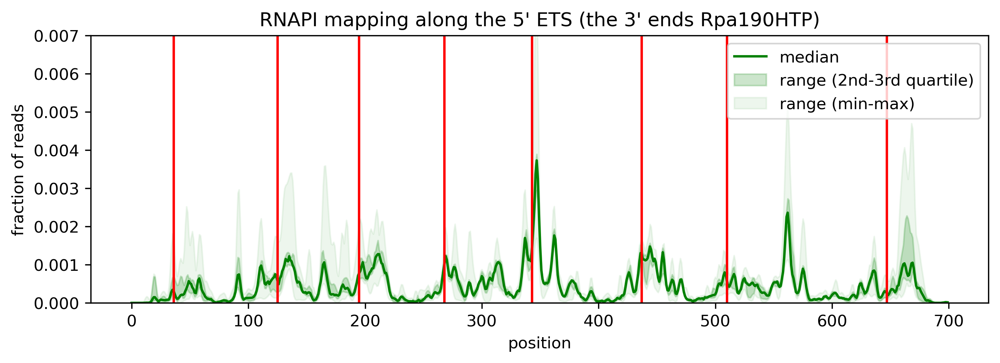

Experiments: 
['EP240614_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP230802_Rpa135HTP_wt_none_1b_PROFILE_3end', 'C23P2-TT181022_Rpa135HTP_wt_none_2_PROFILE_3end', 'seq3-EP240614_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP230405_Rpa135HTP_wt_none_1_PROFILE_3end', 'LP221214_Rpa135HTP_wt_none_2_PROFILE_3end', 'LP230802_Rpa135HTP_wt_none_1a_PROFILE_3end', 'EP190925_Rpa135HTP_wt_none_3_PROFILE_3end', 'C18P2-TT170123_Rpa135HTP_wt_none_1_PROFILE_3end']
Experiments: 
['C23P2-TT181022_Rpa135HTP_wt_none_2_PROFILE_3end_polyA', 'C18P2-TT170123_Rpa135HTP_wt_none_1_PROFILE_3end_polyA', 'EP240614_Rpa135HTP_wt_none_1_PROFILE_3end_polyA', 'EP190925_Rpa135HTP_wt_none_3_PROFILE_3end_polyA', 'LP230802_Rpa135HTP_wt_none_1a_PROFILE_3end_polyA', 'LP230802_Rpa135HTP_wt_none_1b_PROFILE_3end_polyA', 'LP221214_Rpa135HTP_wt_none_2_PROFILE_3end_polyA', 'LP230405_Rpa135HTP_wt_none_1_PROFILE_3end_polyA', 'seq3-EP240614_Rpa135HTP_wt_none_1_PROFILE_3end_polyA']
Experiments: 
['C18P2-TT170123_Rpa135HTP_wt_none_1_PROFILE_3end', 'C

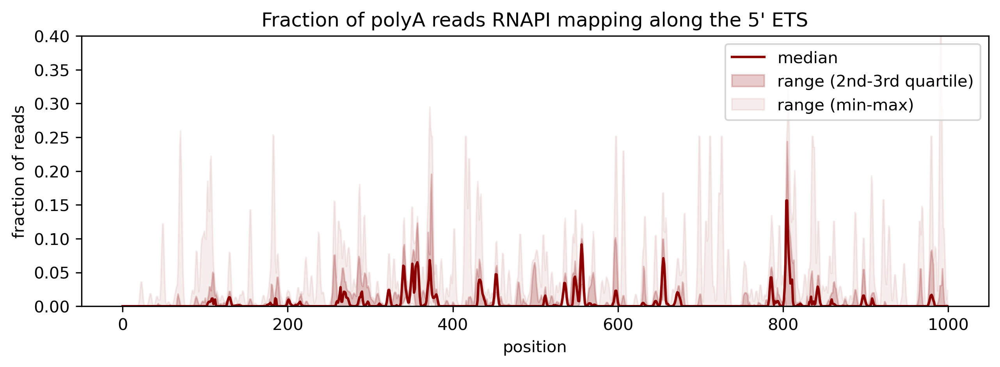

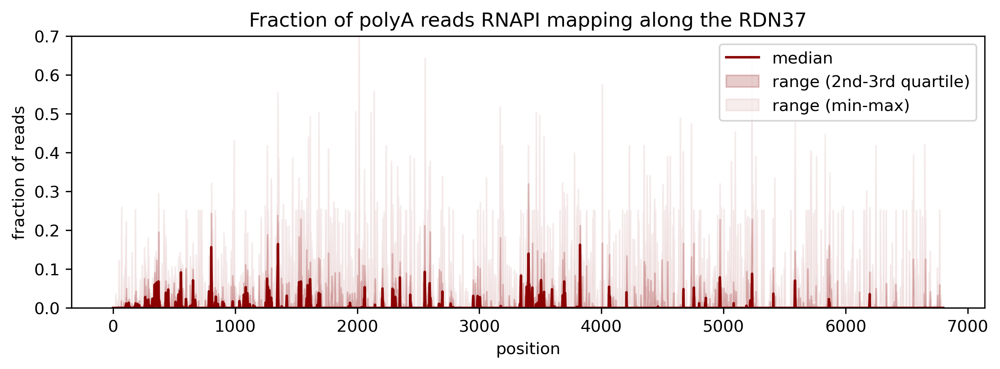

In [6]:
df15_Rpa135_3end = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa135HTP'], 
                                     let_out=['hmo1','0s','25rDNA','UVA','noUV',
                                              'Rnt1','rrp44','trf4','air1','rat1','Rpa12dC','nsi1d'],stats=True)

tt.plotting.plot_as_box_plot(df15_Rpa135_3end, title="RNAPI mapping along the 5' ETS (the 3' ends Rpa190HTP)",
                             dpi=300,ylim=(None,0.007), start=0+300, stop=700+300,figsize=(10,3),
                             h_lines=[i-300 for i in peaks],offset=300)

# polyA reads

df19_Rpa135_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa135HTP'], 
                                let_out=['hmo1','0s','25rDNA','UVA','noUV',
                                         'Rnt1','rrp44','trf4','air1','rat1','Rpa12dC','nsi1d'],
                                         count=False)

# df16_Rpa135_3end_raw = tt.profiles.preprocess(df01_RDN37_3end,let_in=['Rpa135HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA','noUV',
#                                               'Rnt1','rrp44','trf4','air1','rat1','Rpa12dC','nsi1d'],stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df17_Rpa135_3end_polyA_raw = tt.profiles.preprocess(df03_RDN37_polyA,let_in=['Rpa135HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA','noUV',
#                                               'Rnt1','rrp44','trf4','air1','rat1','Rpa12dC','nsi1d'],stats=False,
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df17_Rpa135_3end_polyA_raw.columns = [i.replace("_polyA","") for i in df17_Rpa135_3end_polyA_raw.columns]

# df18_Rpa190_fractionPolyA = df17_Rpa135_3end_polyA_raw / df16_Rpa135_3end_raw

# df19_Rpa135_polyA = tt.profiles.preprocess(df18_Rpa190_fractionPolyA.fillna(0.0),let_in=['Rpa135HTP'], 
#                                      let_out=['hmo1','0s','25rDNA','UVA','noUV',
#                                               'Rnt1','rrp44','trf4','air1','rat1','Rpa12dC','nsi1d'],stats=True,
#                                      smooth=True,pseudocounts_param=False, ntotal_param=False)

tt.plotting.plot_as_box_plot(df19_Rpa135_polyA, title="Fraction of polyA reads RNAPI mapping along the 5' ETS",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=1000+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df19_Rpa135_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

# Rnt1-AID

In [7]:
df01_RDN37_3end.filter(like='Rnt1').sum().sort_values(ascending=False)

EP240606_Rpa190HTP_Rnt1-AID_4h_2_PROFILE_3end         222959.0
seq2-EP240606_Rpa190HTP_Rnt1-AID_4h_2_PROFILE_3end    214054.0
seq4-EP240606_Rpa190HTP_Rnt1-AID_4h_2_PROFILE_3end    201422.0
EP240918_Rpa190HTP_Rnt1-AID_0h_4_PROFILE_3end         108977.0
EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_3end         103968.0
seq9-EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_3end     91431.0
EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_3end          87813.0
seq9-EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_3end     79414.0
EP240313_Rpa190HTP_Rnt1-AID_4h_1_PROFILE_3end          12873.0
EP240313_Rpa190HTP_Rnt1-AID_2h_1_PROFILE_3end           9814.0
EP240614_Rpa135HTP_Rnt1-AID_4h_3_PROFILE_3end           8250.0
seq3-EP240614_Rpa135HTP_Rnt1-AID_4h_3_PROFILE_3end      8058.0
EP240614_Rpa135HTP_Rnt1-AID_0h_4_PROFILE_3end           7067.0
EP240313_Rpa190HTP_Rnt1-AID_0h_1_PROFILE_3end           6730.0
seq3-EP240614_Rpa135HTP_Rnt1-AID_0h_4_PROFILE_3end      6570.0
seq3-EP240614_Rpa135HTP_Rnt1-AID_0h_3_PROFILE_3end     

Experiments: 
['EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_3end', 'EP240918_Rpa190HTP_Rnt1-AID_0h_4_PROFILE_3end', 'seq9-EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_3end', 'EP240313_Rpa190HTP_Rnt1-AID_0h_1_PROFILE_3end']
Experiments: 
['seq9-EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_3end', 'EP240313_Rpa190HTP_Rnt1-AID_4h_1_PROFILE_3end', 'EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_3end', 'EP240918_Rpa190HTP_Rnt1-AID_4h_4_PROFILE_3end']


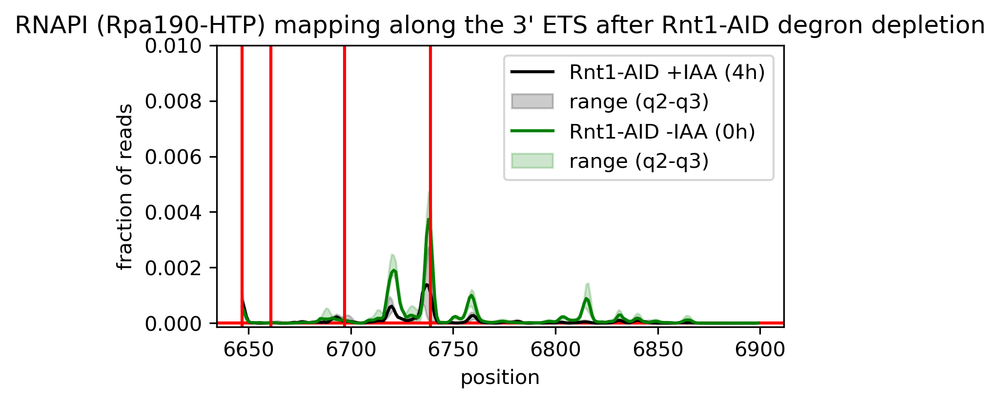

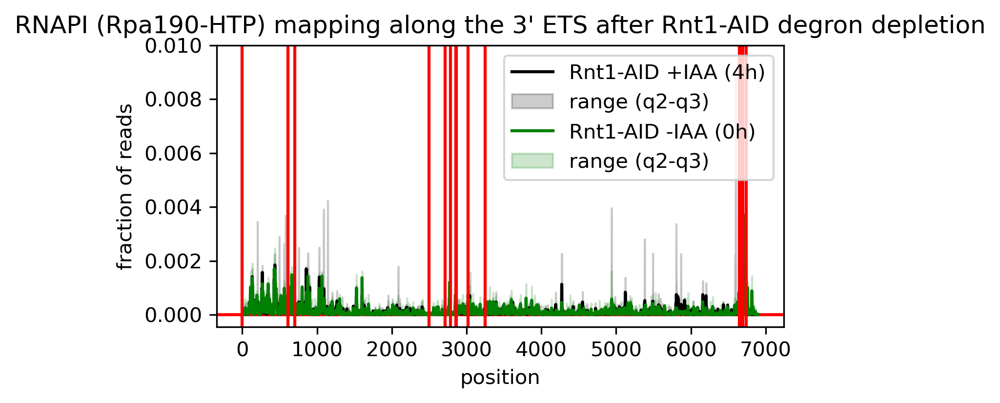

In [8]:
# 3' end
df21_Rpa190_3end_Rnt1AID_0h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','Rnt1-AID_0h'],
                                     let_out=['EP240606'],stats=True)

df22_Rpa190_3end_Rnt1AID_4h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','Rnt1-AID_4h'], 
                                     let_out=['EP240606'],stats=True)

tt.plotting.plot_to_compare(ref=df21_Rpa190_3end_Rnt1AID_0h, df=df22_Rpa190_3end_Rnt1AID_4h,figsize=(5,2.5),ref_label="Rnt1-AID -IAA (0h)",label="Rnt1-AID +IAA (4h)",
                           title="RNAPI (Rpa190-HTP) mapping along the 3' ETS after Rnt1-AID degron depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=6647+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1A-3ETS.png')

tt.plotting.plot_to_compare(ref=df21_Rpa190_3end_Rnt1AID_0h, df=df22_Rpa190_3end_Rnt1AID_4h,figsize=(5,2.5),ref_label="Rnt1-AID -IAA (0h)",label="Rnt1-AID +IAA (4h)",
                           title="RNAPI (Rpa190-HTP) mapping along the 3' ETS after Rnt1-AID degron depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1A-RDN37.png')

Experiments: 
['EP240918_Rpa190HTP_Rnt1-AID_0h_4_PROFILE_5end', 'EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_5end', 'EP240313_Rpa190HTP_Rnt1-AID_0h_1_PROFILE_5end', 'seq9-EP240911_Rpa190HTP_Rnt1-AID_0h_3_PROFILE_5end']
Experiments: 
['seq9-EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_5end', 'EP240911_Rpa190HTP_Rnt1-AID_4h_3_PROFILE_5end', 'EP240313_Rpa190HTP_Rnt1-AID_4h_1_PROFILE_5end', 'EP240918_Rpa190HTP_Rnt1-AID_4h_4_PROFILE_5end']


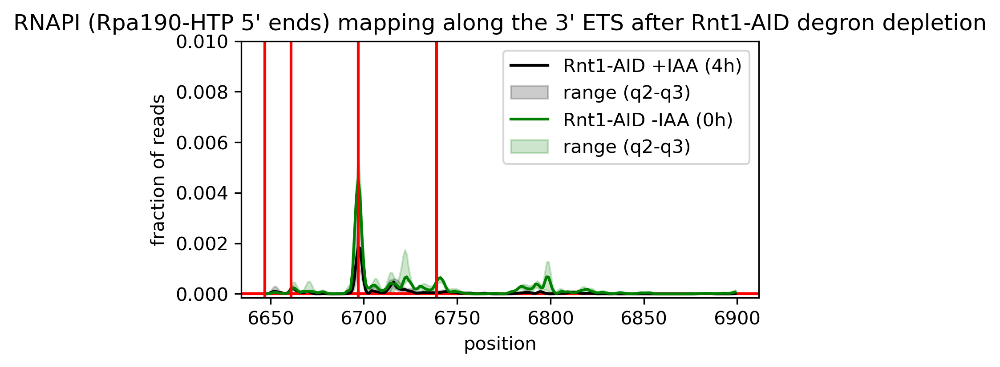

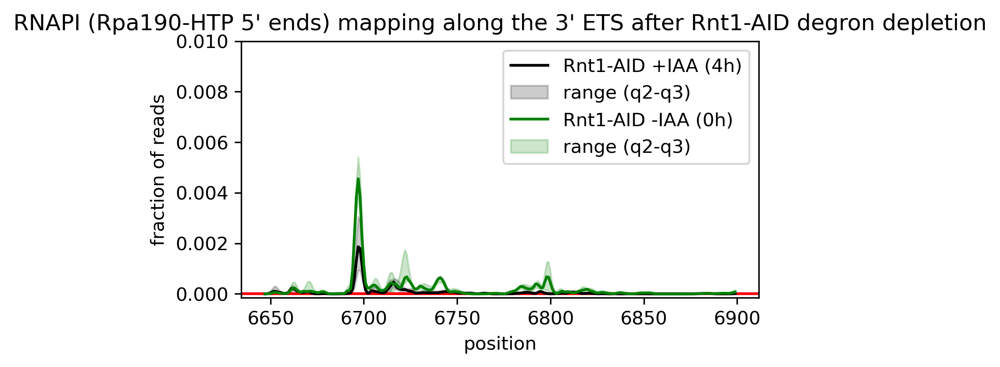

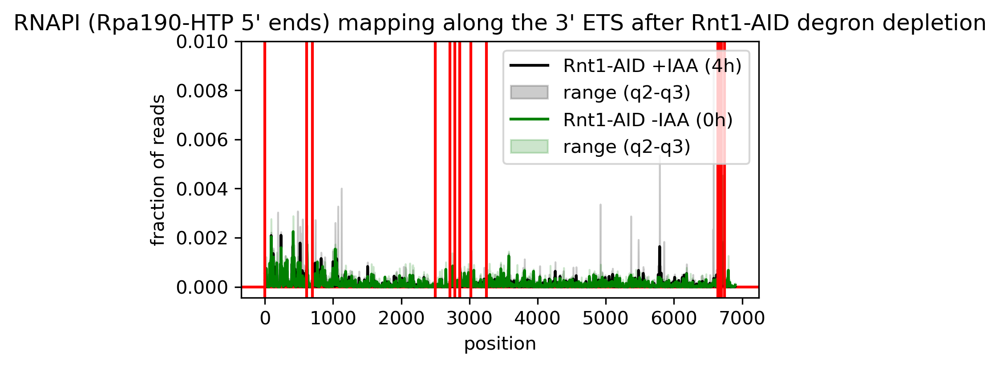

In [9]:
# 5' end
df23_Rpa190_5end_Rnt1AID_0h = tt.profiles.preprocess(df02_RDN37_5end,
                                     let_in=['Rpa190HTP','Rnt1-AID_0h'],
                                     let_out=['EP240606'],stats=True)

df24_Rpa190_5end_Rnt1AID_4h = tt.profiles.preprocess(df02_RDN37_5end,
                                     let_in=['Rpa190HTP','Rnt1-AID_4h'], 
                                     let_out=['EP240606'],stats=True)

tt.plotting.plot_to_compare(ref=df23_Rpa190_5end_Rnt1AID_0h, df=df24_Rpa190_5end_Rnt1AID_4h,figsize=(5,2.5),ref_label="Rnt1-AID -IAA (0h)",label="Rnt1-AID +IAA (4h)",
                           title="RNAPI (Rpa190-HTP 5' ends) mapping along the 3' ETS after Rnt1-AID degron depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=6647+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1A-5end-3ETS.png')

tt.plotting.plot_to_compare(ref=df23_Rpa190_5end_Rnt1AID_0h, df=df24_Rpa190_5end_Rnt1AID_4h,figsize=(5,2.5),ref_label="Rnt1-AID -IAA (0h)",label="Rnt1-AID +IAA (4h)",
                           title="RNAPI (Rpa190-HTP 5' ends) mapping along the 3' ETS after Rnt1-AID degron depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=6647+300, stop=6900+300,
                        #    h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1A-5end-3ETS.png')

tt.plotting.plot_to_compare(ref=df23_Rpa190_5end_Rnt1AID_0h, df=df24_Rpa190_5end_Rnt1AID_4h,figsize=(5,2.5),ref_label="Rnt1-AID -IAA (0h)",label="Rnt1-AID +IAA (4h)",
                           title="RNAPI (Rpa190-HTP 5' ends) mapping along the 3' ETS after Rnt1-AID degron depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1A-5end-RDN37.png')

# trf4ts-trf5d

In [10]:
df01_RDN37_3end.filter(like='trf4').sum().sort_values(ascending=False)

seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end    171427.0
seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end    167673.0
EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end         165924.0
seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end       153137.0
seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end       117492.0
EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end            114522.0
seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_25C_4_PROFILE_3end        95611.0
seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end     90849.0
EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end          72377.0
seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end     70509.0
seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_37C-4h_4_PROFILE_3end     53424.0
EP240918_Rpa190HTP_trf4ts-trf5∆_37C-4h_3_PROFILE_3end          51358.0
EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end             31010.0
seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end        30503.0
EP2409

Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_25C_4_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end']
Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_37C-4h_4_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end']


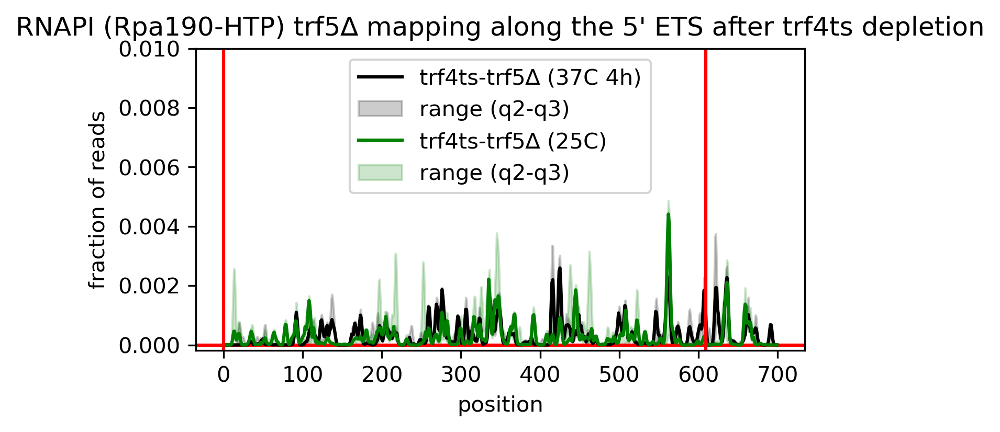

In [11]:
df31_Rpa190_3end_trf4ts_trf5d_0h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','trf4ts-trf5','25C','seq'], 
                                     let_out=['EP240614'],stats=True)

df32_Rpa190_3end_trf4ts_trf5d_4h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','trf4ts-trf5','37C','seq'], 
                                     let_out=['EP240614'],stats=True)

tt.plotting.plot_to_compare(ref=df31_Rpa190_3end_trf4ts_trf5d_0h, df=df32_Rpa190_3end_trf4ts_trf5d_4h,figsize=(5,2.5),ref_label="trf4ts-trf5∆ (25C)",label="trf4ts-trf5∆ (37C 4h)",
                           title="RNAPI (Rpa190-HTP) trf5∆ mapping along the 5' ETS after trf4ts depletion",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R1B-3ETS.png')

# tt.plotting.plot_to_compare(ref=df31_Rpa190_3end_trf4ts_trf5d_0h, df=df32_Rpa190_3end_trf4ts_trf5d_4h,figsize=(5,2.5),ref_label="trf4ts-trf5∆ (25C)",label="trf4ts-trf5∆ (37C 4h)",
#                            title="RNAPI (Rpa190-HTP) trf5∆ mapping along the rRNA after trf4ts depletion",
#                            dpi=300,offset=300, ylim=(None,0.01),
#                            start=0+300, stop=6900+300,
#                            h_lines=[i-300 for i in cleavage_sites.values()],
#                            fname='Fig_R1B-RDN37.png')

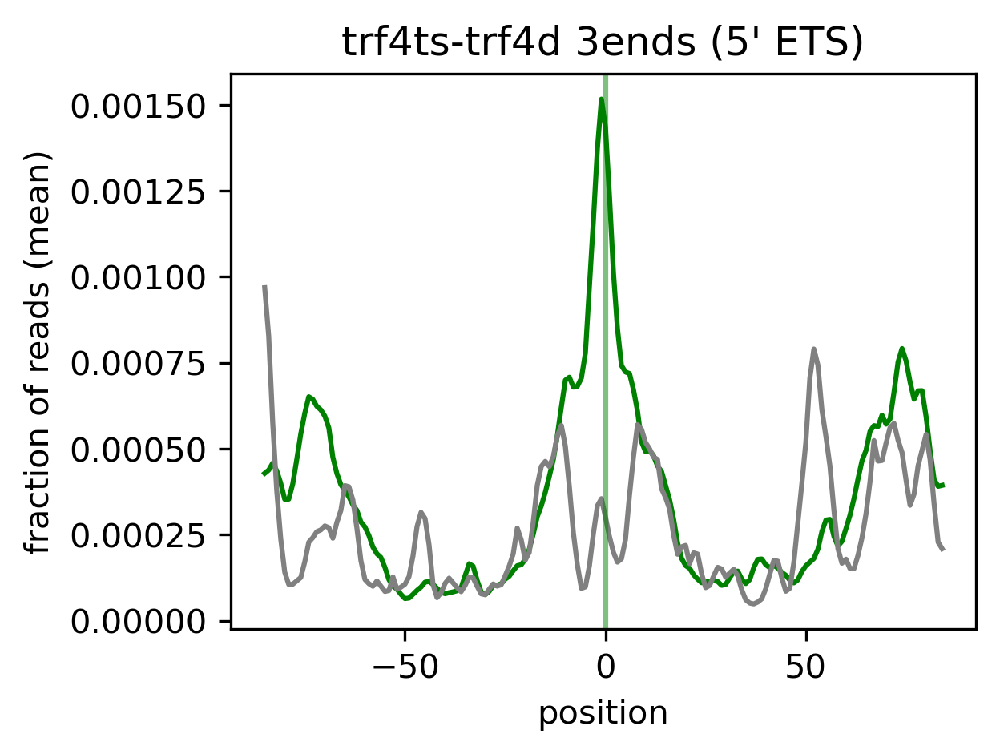

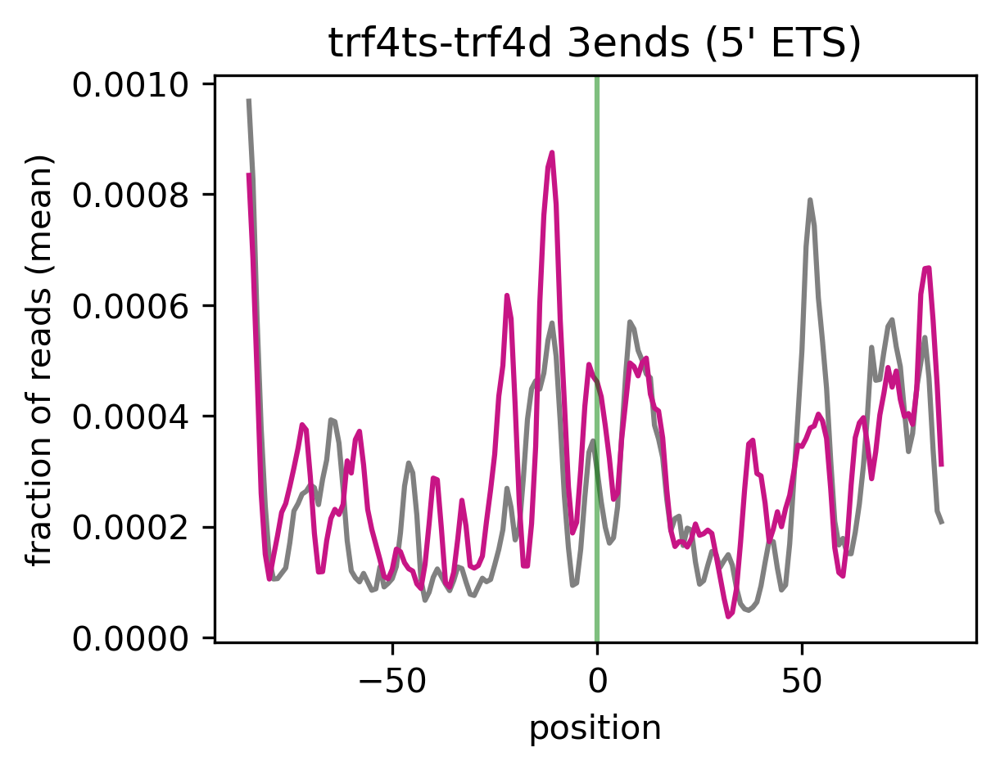

In [12]:
stop=1000
window = 85
elem=" (5' ETS)"

# tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df31_Rpa190_3end_trf4ts_trf5d_0h, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='green', color2="grey", lc='green',fname="Fig_R2Amedian.png",use='median')

tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df31_Rpa190_3end_trf4ts_trf5d_0h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R2Amean.png")

# tt.plotting.cumulativePeaks(df31_Rpa190_3end_trf4ts_trf5d_0h, df2=df32_Rpa190_3end_trf4ts_trf5d_4h, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='grey', color2="mediumvioletred", lc='green',fname="Fig_R2Bmedian.png",use='median')

tt.plotting.cumulativePeaks(df31_Rpa190_3end_trf4ts_trf5d_0h, df2=df32_Rpa190_3end_trf4ts_trf5d_4h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='grey', color2="mediumvioletred", lc='green',fname="Fig_R2Bmean.png")

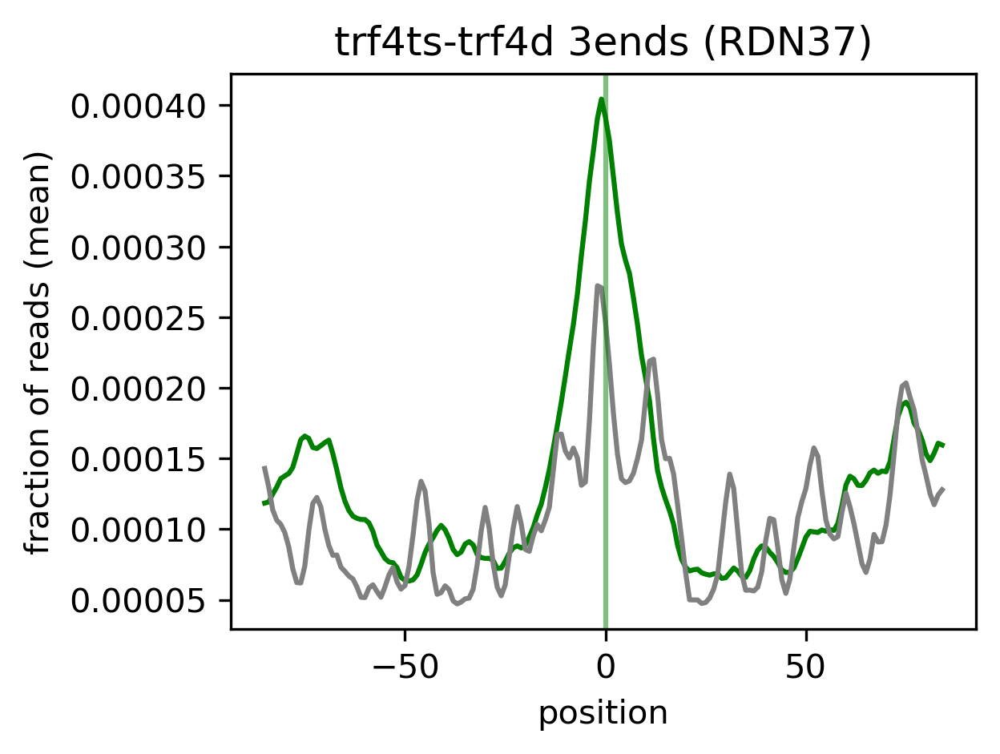

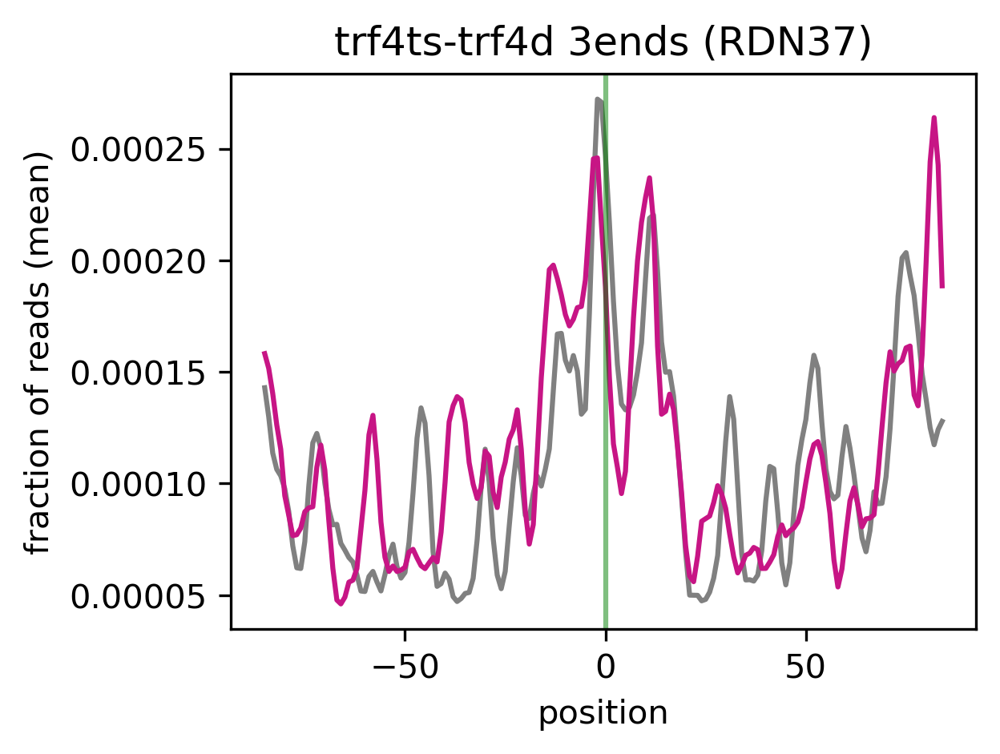

In [13]:
window = 85
stop=7100
elem=" (RDN37)"

# tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df31_Rpa190_3end_trf4ts_trf5d_0h, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='green', color2="grey", lc='green',fname="Fig_R2Cmedian.png",use='median')

tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df31_Rpa190_3end_trf4ts_trf5d_0h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R2Cmean.png")

# tt.plotting.cumulativePeaks(df31_Rpa190_3end_trf4ts_trf5d_0h, df2=df32_Rpa190_3end_trf4ts_trf5d_4h, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='grey', color2="mediumvioletred", lc='green',fname="Fig_R2Dmedian.png",use='median')

tt.plotting.cumulativePeaks(df31_Rpa190_3end_trf4ts_trf5d_0h, df2=df32_Rpa190_3end_trf4ts_trf5d_4h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="trf4ts-trf4d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='grey', color2="mediumvioletred", lc='green',fname="Fig_R2Dmean.png")

Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_25C_4_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end']
Experiments: 
['seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end_polyA', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end_polyA', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end_polyA', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_25C_4_PROFILE_3end_polyA', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end_polyA']
Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_25C_2_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_25C_4_PROFILE_3end']
Fraxction of polyA reads in the dataset:

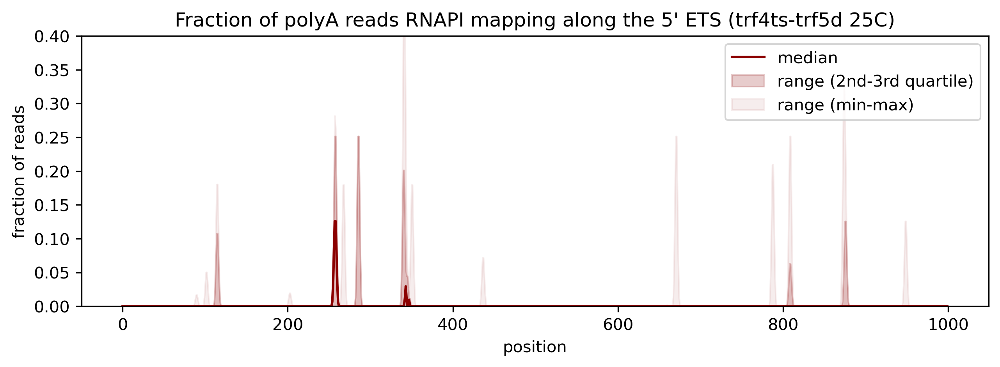

Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_37C-4h_4_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end']
Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end_polyA', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_37C-4h_4_PROFILE_3end_polyA', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end_polyA', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end_polyA', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end_polyA']
Experiments: 
['seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end', 'seq2-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_1_PROFILE_3end', 'seq4-EP240606_Rpa190HTP_trf4ts-trf5∆_37C-4h_2_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_trf4ts-trf5∆_37C-4h_4_PROFILE_3e

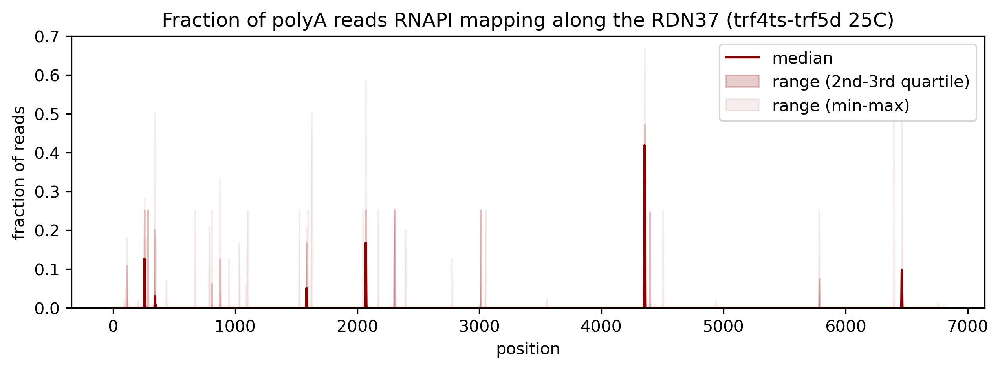

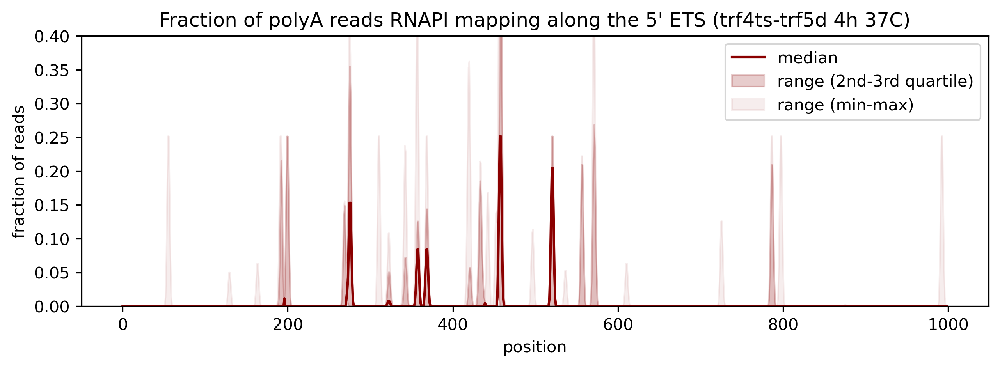

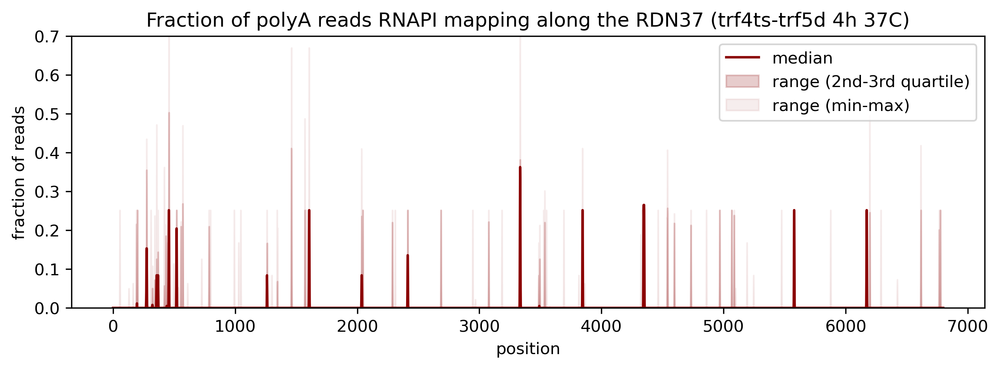

In [14]:
# polyA reads

# trf4ts-trf5d 25C

df36_Rpa190_3end_trf4ts_trf5d_0h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','trf4ts-trf5','25C','seq'], let_out=['seq3'],
                                         count=False)

# df33_Rpa190_3end_trf4ts_trf5d_0h_raw = tt.profiles.preprocess(df01_RDN37_3end,
#                                      let_in=['Rpa190HTP','trf4ts-trf5','25C','seq'], let_out=['seq3'], stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df34_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw = tt.profiles.preprocess(df03_RDN37_polyA,
#                                      let_in=['Rpa190HTP','trf4ts-trf5','25C','seq'], let_out=['seq3'], stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)


# df34_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw.columns = [i.replace("_polyA","") for i in df34_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw.columns]

# df35_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw = df34_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw / df33_Rpa190_3end_trf4ts_trf5d_0h_raw

# df36_Rpa190_3end_trf4ts_trf5d_0h_polyA = tt.profiles.preprocess(df35_Rpa190_3end_trf4ts_trf5d_0h_polyA_raw.fillna(0.0),let_in=['Rpa190HTP'], 
#                                      stats=True, smooth=True,pseudocounts_param=False, ntotal_param=False)

tt.plotting.plot_as_box_plot(df36_Rpa190_3end_trf4ts_trf5d_0h_polyA, title="Fraction of polyA reads RNAPI mapping along the 5' ETS (trf4ts-trf5d 25C)",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=1000+300,color='darkred',figsize=(10,3),
                             offset=300,)

tt.plotting.plot_as_box_plot(df36_Rpa190_3end_trf4ts_trf5d_0h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (trf4ts-trf5d 25C)",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300, fname="Fig_R2E_25C.png")

# trf4ts-trf5d 4h 37C

df310_Rpa190_3end_trf4ts_trf5d_4h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','trf4ts-trf5','37C','seq'], let_out=['seq3'],
                                         count=False)

# df37_Rpa190_3end_trf4ts_trf5d_4h_raw = tt.profiles.preprocess(df01_RDN37_3end,
#                                      let_in=['Rpa190HTP','trf4ts-trf5','37C','seq'], let_out=['seq3'], stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)

# df38_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw = tt.profiles.preprocess(df03_RDN37_polyA,
#                                      let_in=['Rpa190HTP','trf4ts-trf5','37C','seq'], let_out=['seq3'], stats=False, 
#                                      smooth=False,pseudocounts_param=False, ntotal_param=False)


# df38_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw.columns = [i.replace("_polyA","") for i in df38_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw.columns]

# df39_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw = df38_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw / df37_Rpa190_3end_trf4ts_trf5d_4h_raw

# df310_Rpa190_3end_trf4ts_trf5d_4h_polyA = tt.profiles.preprocess(df39_Rpa190_3end_trf4ts_trf5d_4h_polyA_raw.fillna(0.0),let_in=['Rpa190HTP'], 
#                                      stats=True, smooth=True,pseudocounts_param=False, ntotal_param=False)

tt.plotting.plot_as_box_plot(df310_Rpa190_3end_trf4ts_trf5d_4h_polyA, title="Fraction of polyA reads RNAPI mapping along the 5' ETS (trf4ts-trf5d 4h 37C)",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=1000+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df310_Rpa190_3end_trf4ts_trf5d_4h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (trf4ts-trf5d 4h 37C)",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300, fname="Fig_R2E_37C.png")

# Rrp44-exo

In [15]:
df01_RDN37_3end.filter(like='rrp44').sum().sort_values(ascending=False)

EP240806_Rpa135HTP_Rpa12dC-rrp44D551N_none_3_PROFILE_3end         757380.0
EP240806_Rpa135HTP_rrp44D551N_none_4_PROFILE_3end                 752945.0
seq9-EP240926_Rpa135HTP_Rpa12dC-rrp44D551N_none_6_PROFILE_3end    318571.0
EP240918_Rpa135HTP_Rpa12dC-rrp44D551N_none_5_PROFILE_3end         202297.0
EP240918_Rpa135HTP_rrp44D551N_none_6_PROFILE_3end                 168987.0
EP240806_Rpa190HTP_rrp44D551N_none_3_PROFILE_3end                 152742.0
EP240911_Rpa135HTP_Rpa12dC-rrp44D551N_none_4_PROFILE_3end         150729.0
seq9-EP240911_Rpa135HTP_Rpa12dC-rrp44D551N_none_4_PROFILE_3end    128201.0
EP240911_Rpa135HTP_rrp44D551N_none_5_PROFILE_3end                 118491.0
seq9-EP240926_Rpa135HTP_rrp44D551N_none_7_PROFILE_3end            109330.0
seq9-EP240911_Rpa135HTP_rrp44D551N_none_5_PROFILE_3end            107809.0
EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end                  77219.0
seq9-EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end             68931.0
EP240918_Rpa190HTP_rrp44D

Experiments: 
['EP240918_Rpa190HTP_rrp44D551N_none_5_PROFILE_3end', 'EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end', 'seq9-EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end', 'EP240806_Rpa190HTP_rrp44D551N_none_3_PROFILE_3end', 'seq4-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end', 'seq4-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end']
Experiments: 
['EP240918_Rpa135HTP_rrp44D551N_none_6_PROFILE_3end', 'seq4-EP240524_Rpa135HTP_rrp44D551N_none_2_PROFILE_3end', 'seq9-EP240911_Rpa135HTP_rrp44D551N_none_5_PROFILE_3end', 'EP240911_Rpa135HTP_rrp44D551N_none_5_PROFILE_3end', 'seq1-EP240524_Rpa135HTP_rrp44D551N_none_1_PROFILE_3end', 'EP240806_Rpa135HTP_rrp44D551N_none_4_PROFILE_3end', 'seq9-EP240926_Rpa135HTP_rrp44D551N_none_7_PROFILE_3end', 'seq4-EP240524_Rpa135HTP_rrp44D551N_none_1_PROFILE_3end', 'seq1-EP240524_Rpa135HTP_rrp44D551N_none_2_PROFILE_3end']
Experiments: 


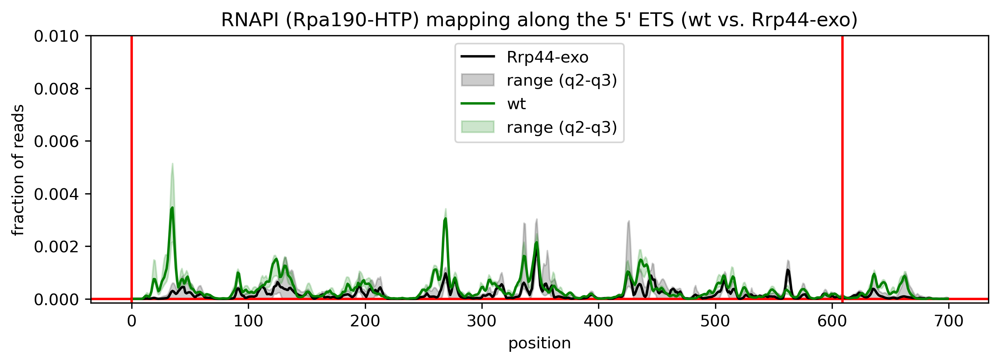

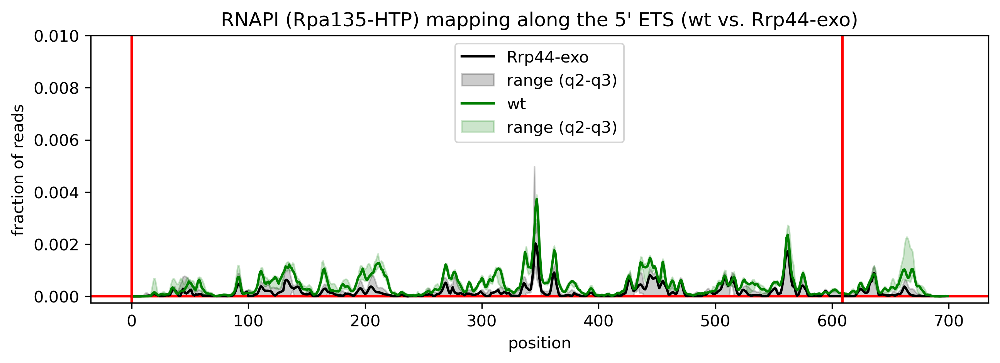

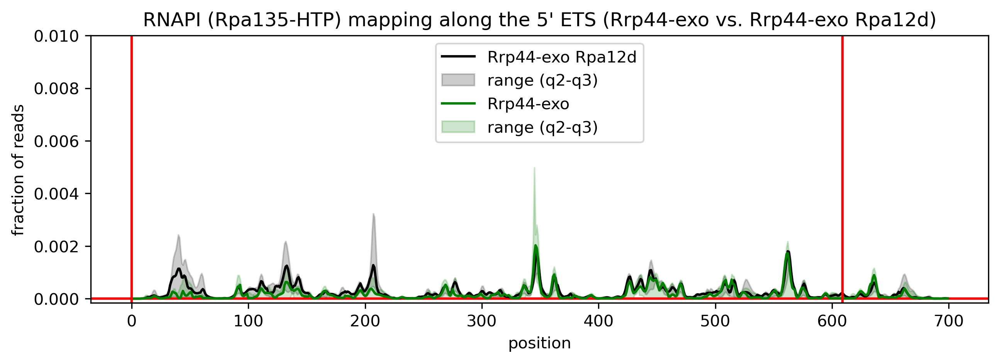

In [16]:
df41_Rpa190_rrp44D551N_3end = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','rrp44D551N'],
                                     let_out=['EP2406'], 
                                     stats=True)

df42_Rpa135_rrp44D551N_3end = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa135HTP','rrp44D551N'], 
                                     let_out=['Rpa12dC','EP2406'],
                                     stats=True)

df43_Rpa135_Rpa12dC_rrp44D551N_3end = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa135HTP','Rpa12dC-rrp44D551N'], 
                                     let_out=['EP2406'],
                                     stats=True)

tt.plotting.plot_to_compare(ref=df11_Rpa190_3end, df=df41_Rpa190_rrp44D551N_3end,figsize=(10,3),ref_label="wt",label="Rrp44-exo",
                           title="RNAPI (Rpa190-HTP) mapping along the 5' ETS (wt vs. Rrp44-exo)",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R3A_5ETS.png')

tt.plotting.plot_to_compare(ref=df15_Rpa135_3end, df=df42_Rpa135_rrp44D551N_3end,figsize=(10,3),ref_label="wt",label="Rrp44-exo",
                           title="RNAPI (Rpa135-HTP) mapping along the 5' ETS (wt vs. Rrp44-exo)",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R3B_5ETS.png')

tt.plotting.plot_to_compare(ref=df42_Rpa135_rrp44D551N_3end, df=df43_Rpa135_Rpa12dC_rrp44D551N_3end,figsize=(10,3),ref_label="Rrp44-exo",label="Rrp44-exo Rpa12d",
                           title="RNAPI (Rpa135-HTP) mapping along the 5' ETS (Rrp44-exo vs. Rrp44-exo Rpa12d)",
                           dpi=300,offset=300, ylim=(None,0.01),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R3C_5ETS.png')

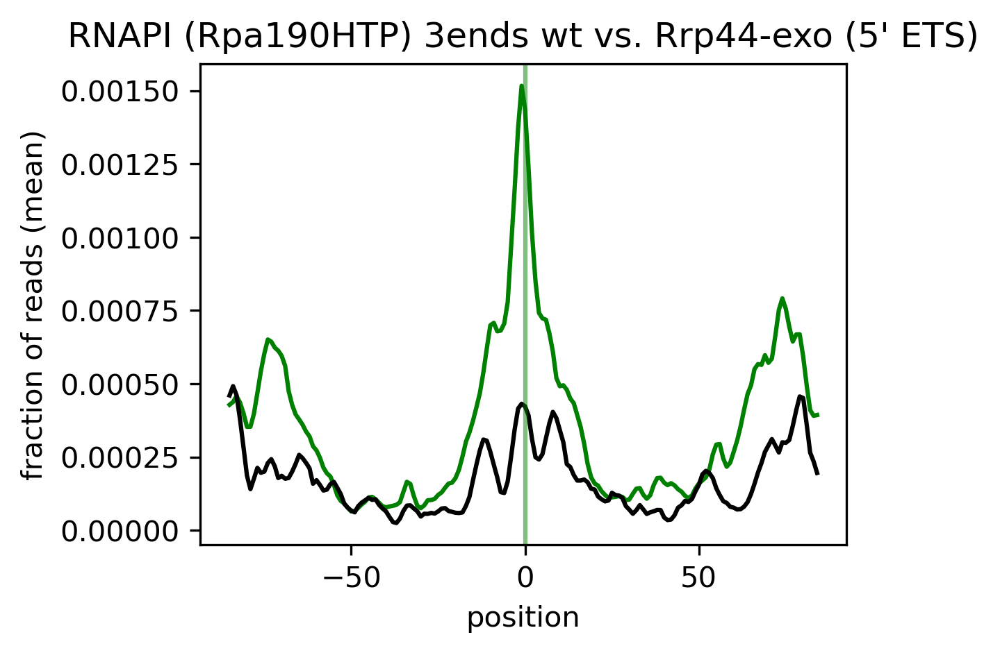

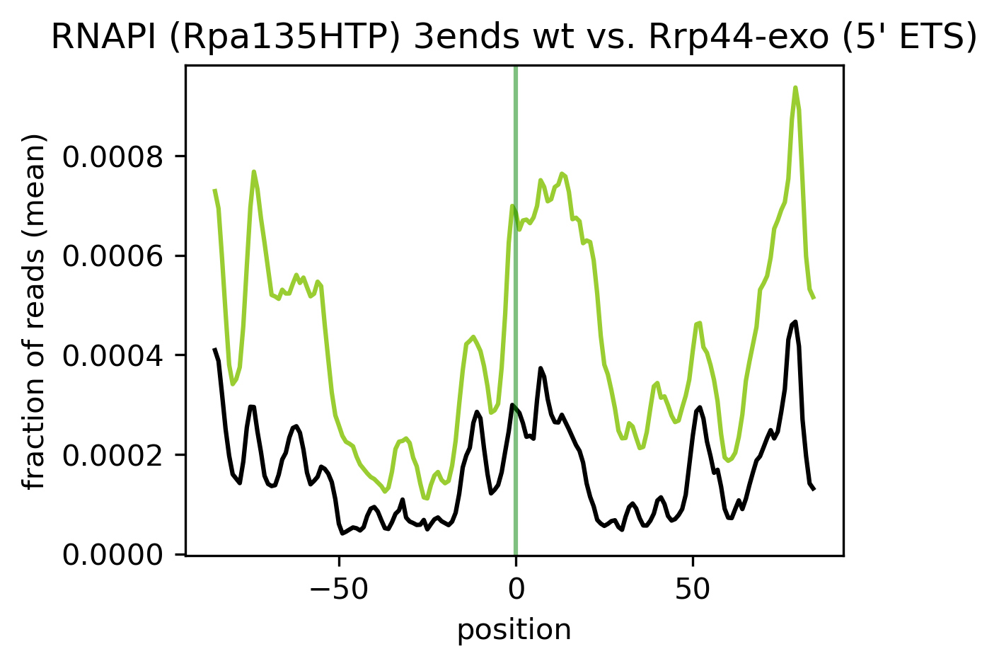

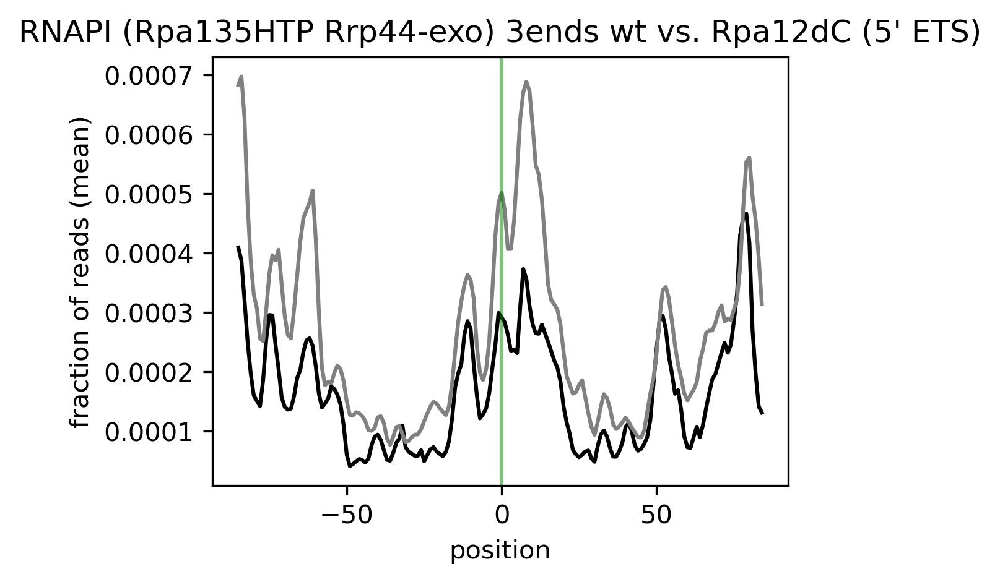

In [17]:
stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df41_Rpa190_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa190HTP) 3ends wt vs. Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="black", lc='green',fname="Fig_R3Dmean_3ETS.png")

tt.plotting.cumulativePeaks(df15_Rpa135_3end, df2=df42_Rpa135_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP) 3ends wt vs. Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='yellowgreen', color2="black", lc='green',fname="Fig_R3Emean_3ETS.png")

tt.plotting.cumulativePeaks(df42_Rpa135_rrp44D551N_3end, df2=df43_Rpa135_Rpa12dC_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP Rrp44-exo) 3ends wt vs. Rpa12dC"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='black', color2="grey", lc='green',fname="Fig_R3Fmean_3ETS.png")

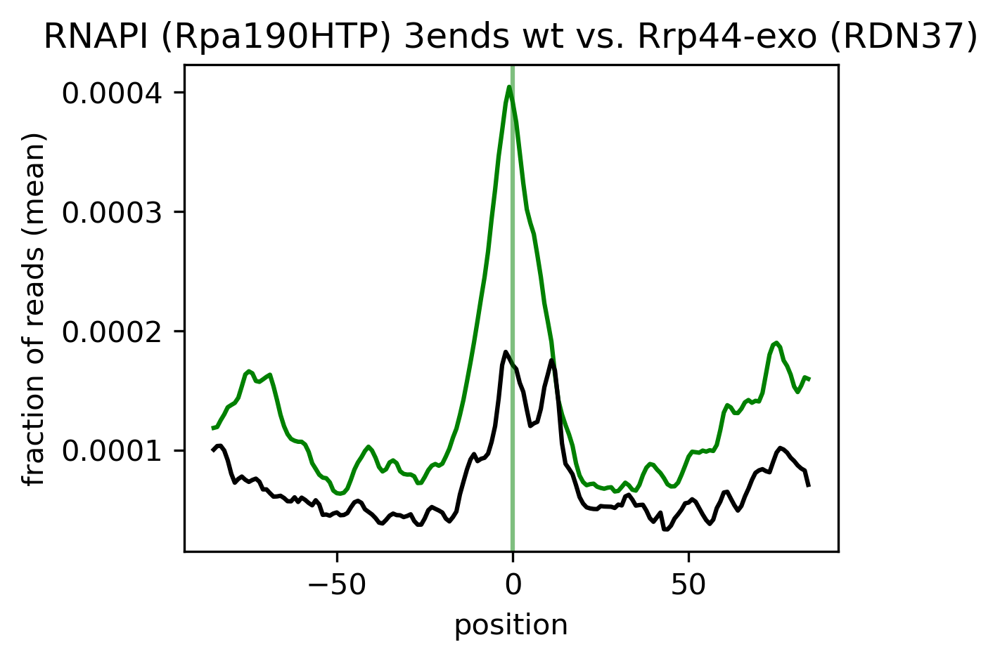

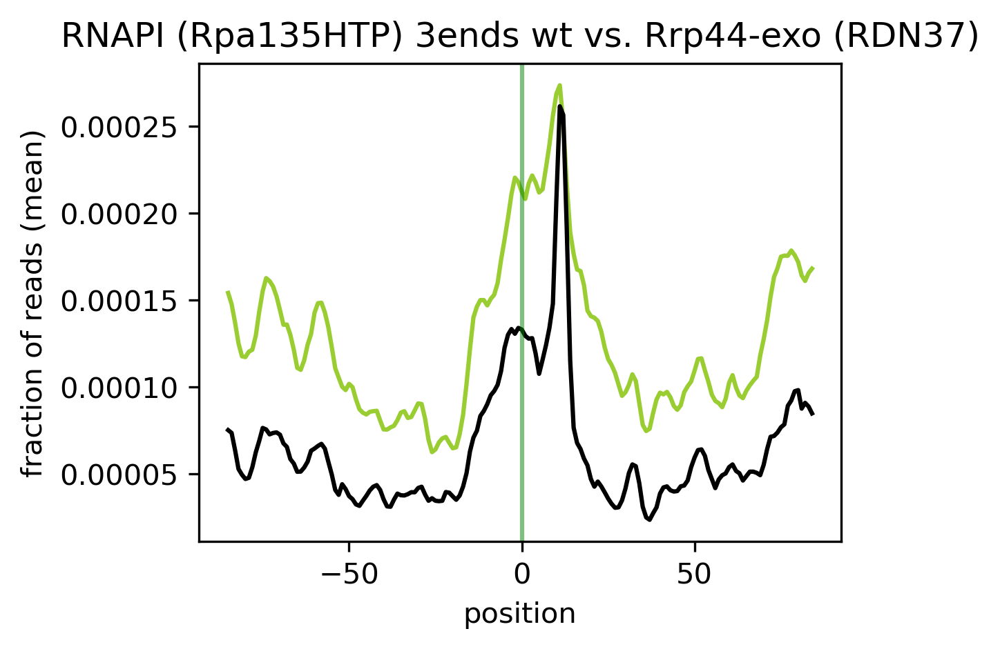

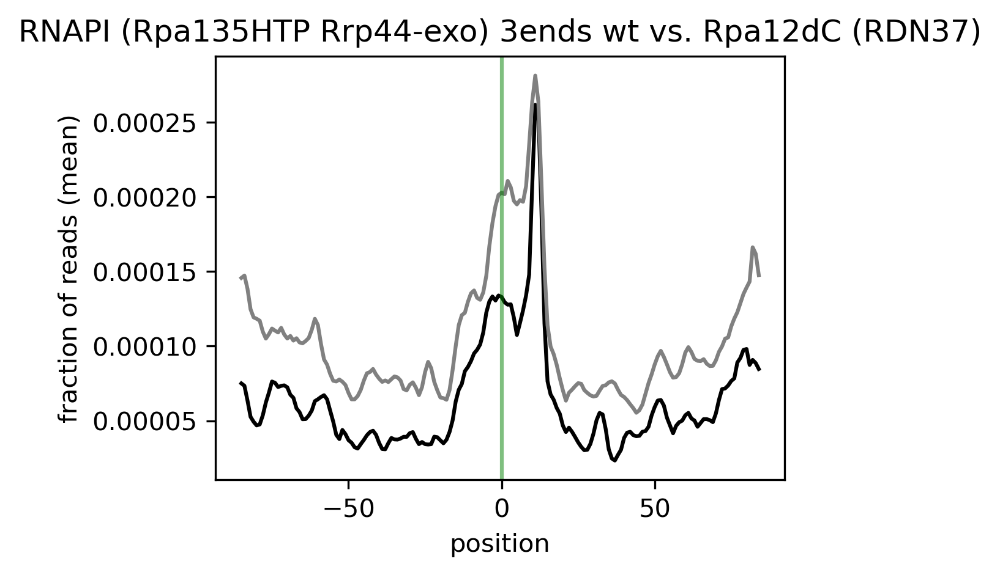

In [18]:
window = 85
stop=7100
elem=" (RDN37)"

tt.plotting.cumulativePeaks(df11_Rpa190_3end, df2=df41_Rpa190_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa190HTP) 3ends wt vs. Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="black", lc='green',fname="Fig_R3Dmean_RDN37.png")

tt.plotting.cumulativePeaks(df15_Rpa135_3end, df2=df42_Rpa135_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP) 3ends wt vs. Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='yellowgreen', color2="black", lc='green',fname="Fig_R3Emean_RDN37.png")

tt.plotting.cumulativePeaks(df42_Rpa135_rrp44D551N_3end, df2=df43_Rpa135_Rpa12dC_rrp44D551N_3end, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP Rrp44-exo) 3ends wt vs. Rpa12dC"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='black', color2="grey", lc='green',fname="Fig_R3Fmean_RDN37.png")

Experiments: 
['EP240918_Rpa190HTP_rrp44D551N_none_5_PROFILE_3end', 'EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end', 'seq9-EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end', 'EP240806_Rpa190HTP_rrp44D551N_none_3_PROFILE_3end', 'seq4-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end', 'seq4-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end']
Experiments: 
['seq4-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end_polyA', 'EP240918_Rpa190HTP_rrp44D551N_none_5_PROFILE_3end_polyA', 'EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end_polyA', 'seq4-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end_polyA', 'seq9-EP240911_Rpa190HTP_rrp44D551N_none_4_PROFILE_3end_polyA', 'EP240806_Rpa190HTP_rrp44D551N_none_3_PROFILE_3end_polyA', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_2_PROFILE_3end_polyA', 'seq1-EP240524_Rpa190HTP_rrp44D551N_none_1_PROFILE_3end_polyA']
Experiments: 
['EP240806

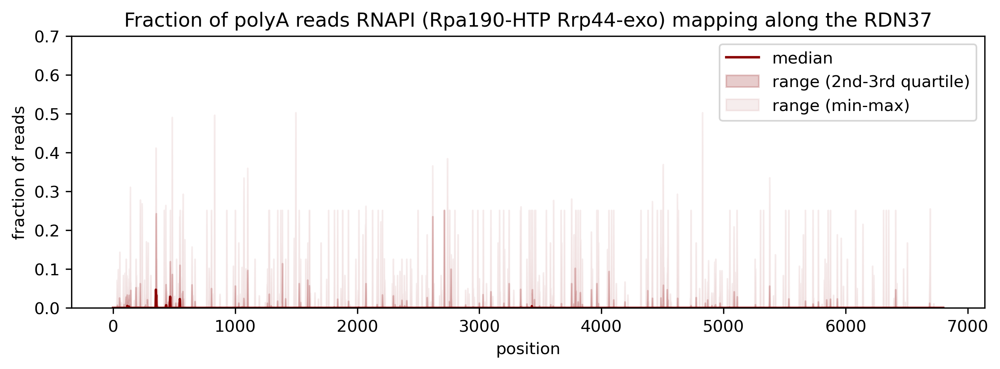

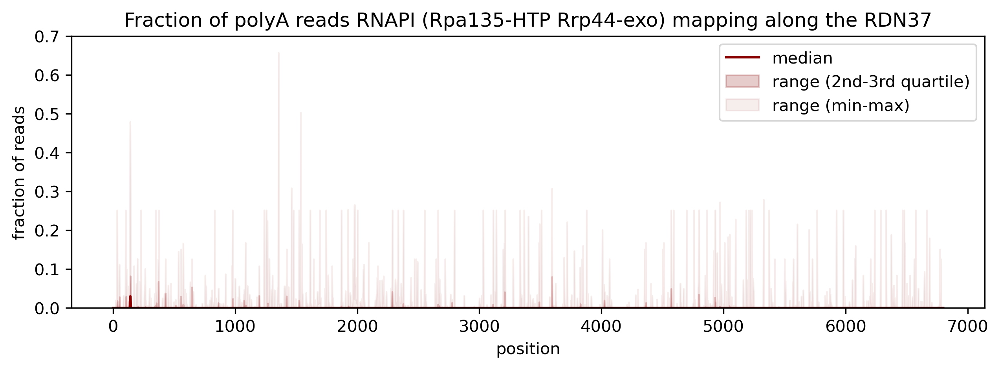

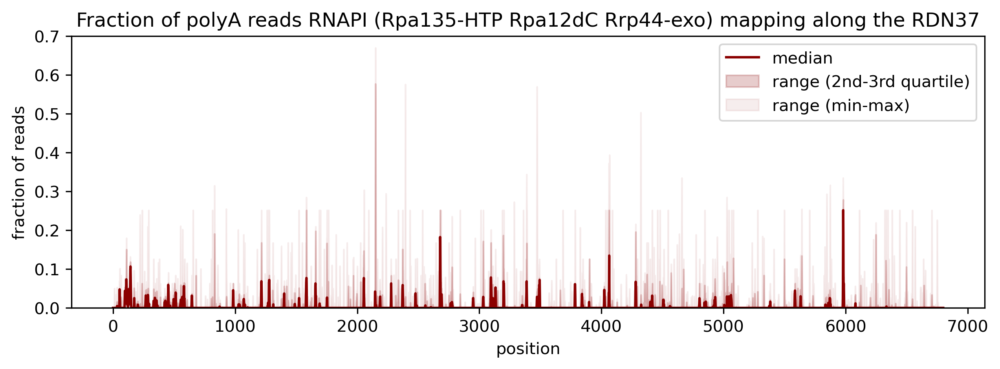

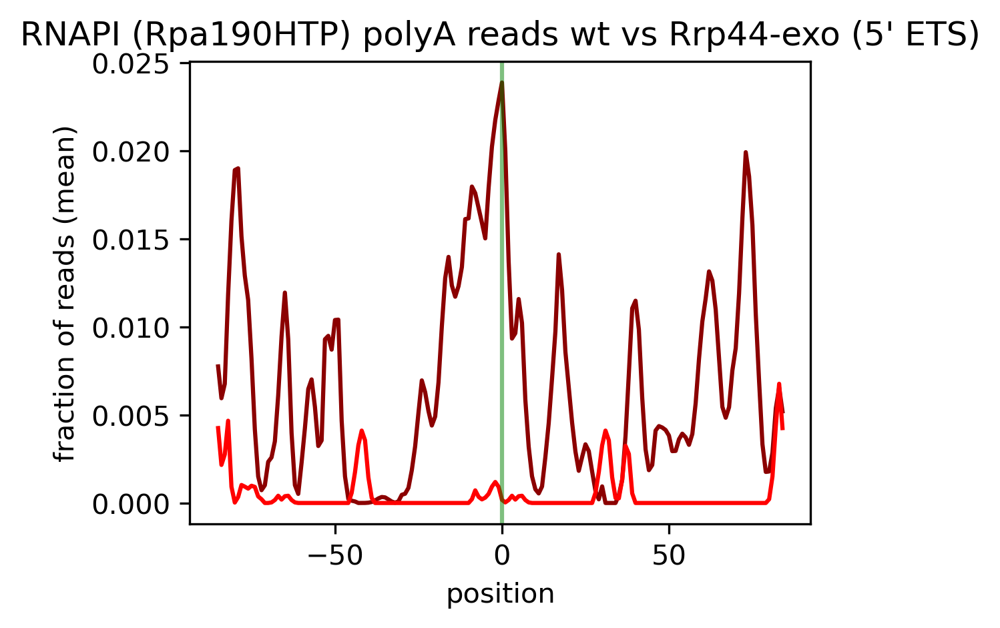

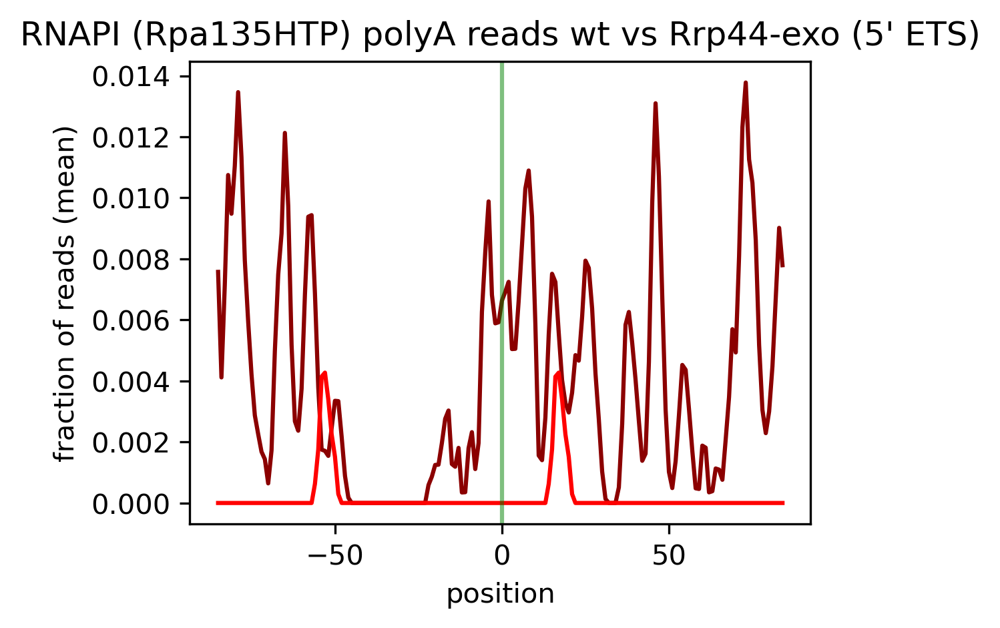

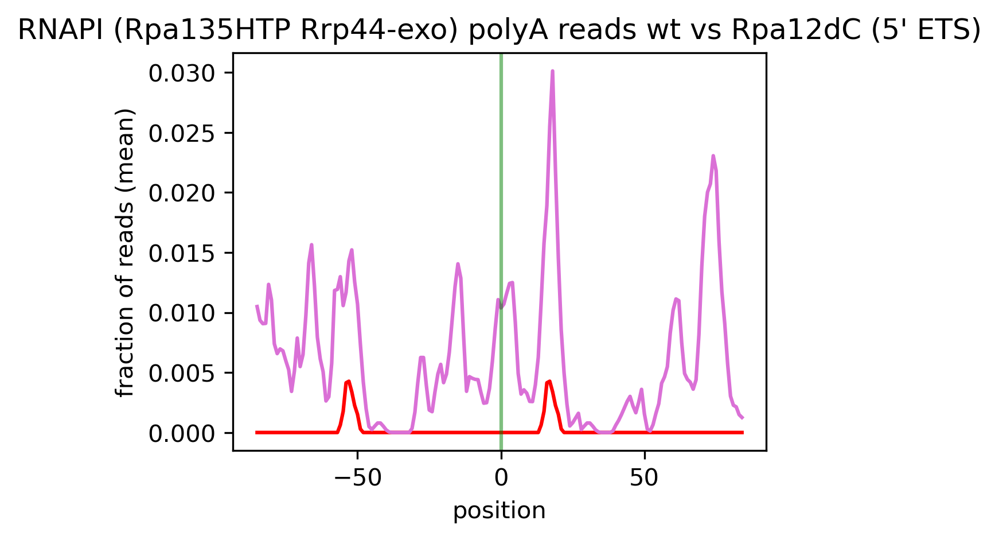

In [19]:
df44_Rpa190_rrp44D551N_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','rrp44D551N'],let_out=['EP2406'],
                                         count=False)

df45_Rpa135_rrp44D551N_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa135HTP','rrp44D551N'],let_out=['EP2406', 'Rpa12dC'],
                                         count=False)

df46_Rpa135_Rpa12dC_rrp44D551N_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa135HTP','Rpa12dC-rrp44D551N'], 
                                let_out=['EP2406','seq1-EP2405','seq4-EP2405'],
                                         count=False)

tt.plotting.plot_as_box_plot(df44_Rpa190_rrp44D551N_polyA, title="Fraction of polyA reads RNAPI (Rpa190-HTP Rrp44-exo) mapping along the RDN37",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df45_Rpa135_rrp44D551N_polyA, title="Fraction of polyA reads RNAPI (Rpa135-HTP Rrp44-exo) mapping along the RDN37",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df46_Rpa135_Rpa12dC_rrp44D551N_polyA, title="Fraction of polyA reads RNAPI (Rpa135-HTP Rpa12dC Rrp44-exo) mapping along the RDN37",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)


stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df14_Rpa190_polyA, df2=df44_Rpa190_rrp44D551N_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa190HTP) polyA reads wt vs Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='darkred', color2="red", lc='green',fname="Fig_R3Gmean_5ETS.png")

tt.plotting.cumulativePeaks(df19_Rpa135_polyA, df2=df45_Rpa135_rrp44D551N_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP) polyA reads wt vs Rrp44-exo"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='darkred', color2="red", lc='green',fname="Fig_R3Hmean_5ETS.png")

tt.plotting.cumulativePeaks(df45_Rpa135_rrp44D551N_polyA, df2=df46_Rpa135_Rpa12dC_rrp44D551N_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI (Rpa135HTP Rrp44-exo) polyA reads wt vs Rpa12dC"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='red', color2="orchid", lc='green',fname="Fig_R3Imean_5ETS.png")

# rat1-1

In [20]:
df01_RDN37_3end.filter(like='rat1-1').sum().sort_values(ascending=False)

EP240806_Rpa190HTP_rat1-1_37C-2h_5_PROFILE_3end         194267.0
EP240806_Rpa190HTP_rat1-1_37C-2h_4_PROFILE_3end         178760.0
EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end            117086.0
EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end             92095.0
seq1-EP240524_Rpa190HTP_rat1-1_25C_3_PROFILE_3end        60566.0
EP240918_Rpa190HTP_rat1-1_37C-2h_6_PROFILE_3end          52517.0
seq4-EP240524_Rpa190HTP_rat1-1_25C_3_PROFILE_3end        34402.0
seq1-EP240524_Rpa190HTP_rat1-1_37C-2h_3_PROFILE_3end     28089.0
seq1-EP240524_Rpa190HTP_rat1-1_37C-2h_2_PROFILE_3end     26728.0
EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end             23045.0
seq4-EP240524_Rpa190HTP_rat1-1_37C-2h_3_PROFILE_3end     19070.0
seq1-EP240524_Rpa190HTP_rat1-1_25C_2_PROFILE_3end        13506.0
seq4-EP240524_Rpa190HTP_rat1-1_37C-2h_2_PROFILE_3end     12479.0
seq4-EP240524_Rpa190HTP_rat1-1_25C_2_PROFILE_3end         4274.0
seq1-EP240524_Rpa190HTP_rat1-1_25C_1_PROFILE_3end         1746.0
seq4-EP240524_Rpa190HTP_r

Experiments: 
['EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end', 'EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end', 'EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end']
Experiments: 
['EP240806_Rpa190HTP_rat1-1_37C-2h_4_PROFILE_3end', 'EP240918_Rpa190HTP_rat1-1_37C-2h_6_PROFILE_3end', 'EP240806_Rpa190HTP_rat1-1_37C-2h_5_PROFILE_3end']


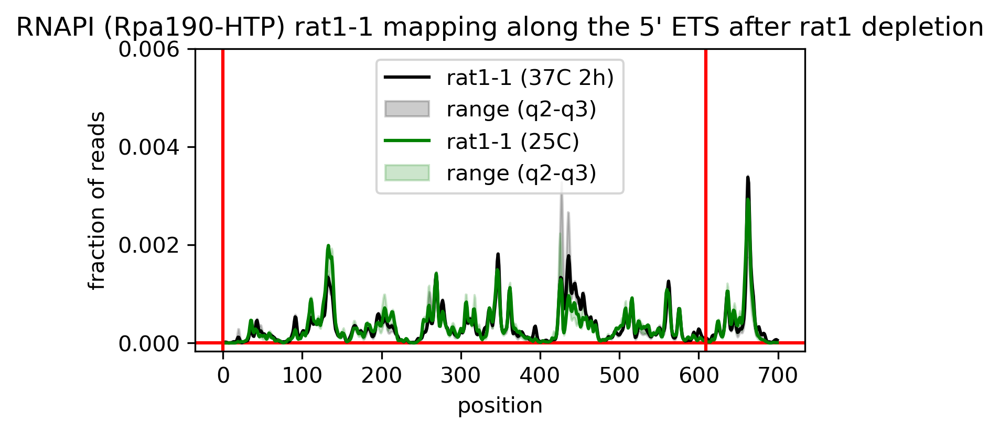

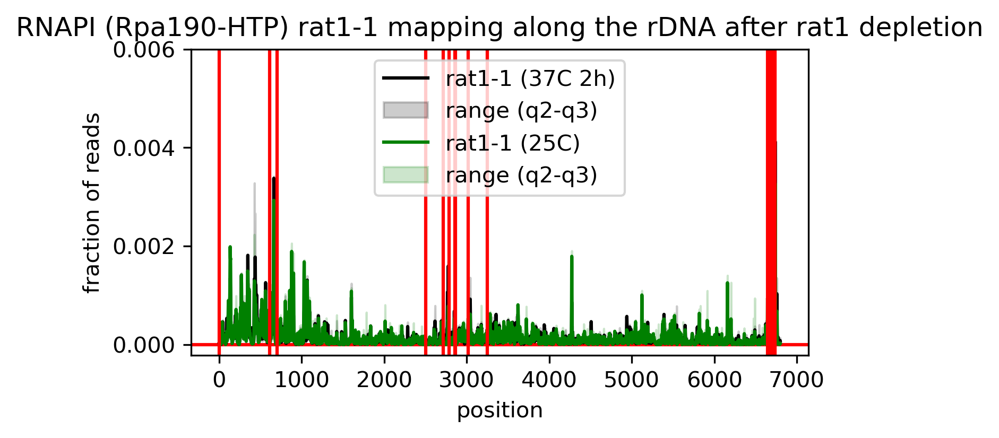

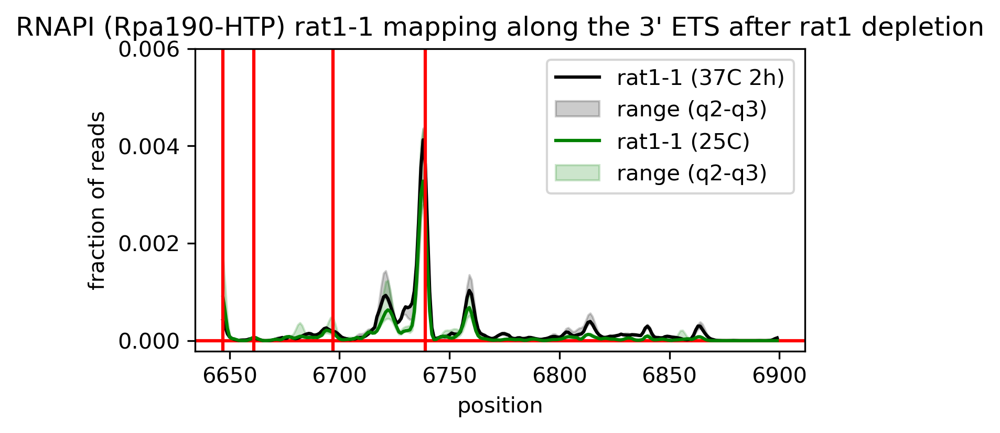

In [21]:
df51_Rpa190_3end_rat11_0h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','rat1-1','25C'],
                                     let_out=['EP2405'], stats=True)

df52_Rpa190_3end_rat11_2h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','rat1-1','37C',],
                                     let_out=['EP2405'],stats=True)

tt.plotting.plot_to_compare(ref=df51_Rpa190_3end_rat11_0h, df=df52_Rpa190_3end_rat11_2h,figsize=(5,2.5),ref_label="rat1-1 (25C)",label="rat1-1 (37C 2h)",
                           title="RNAPI (Rpa190-HTP) rat1-1 mapping along the 5' ETS after rat1 depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R4A-5ETS.png')

tt.plotting.plot_to_compare(ref=df51_Rpa190_3end_rat11_0h, df=df52_Rpa190_3end_rat11_2h,figsize=(5,2.5),ref_label="rat1-1 (25C)",label="rat1-1 (37C 2h)",
                           title="RNAPI (Rpa190-HTP) rat1-1 mapping along the rDNA after rat1 depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=0+300, stop=6800+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R4B-RDN37.png')

tt.plotting.plot_to_compare(ref=df51_Rpa190_3end_rat11_0h, df=df52_Rpa190_3end_rat11_2h,figsize=(5,2.5),ref_label="rat1-1 (25C)",label="rat1-1 (37C 2h)",
                           title="RNAPI (Rpa190-HTP) rat1-1 mapping along the 3' ETS after rat1 depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=6647+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R4C-3ETS.png')

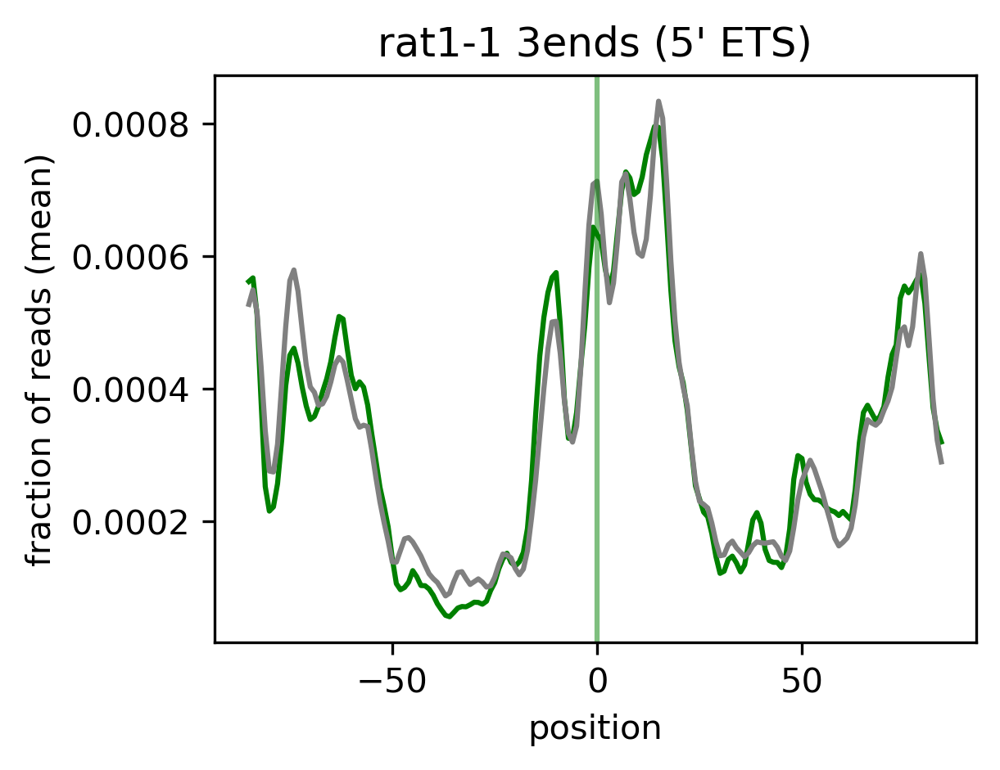

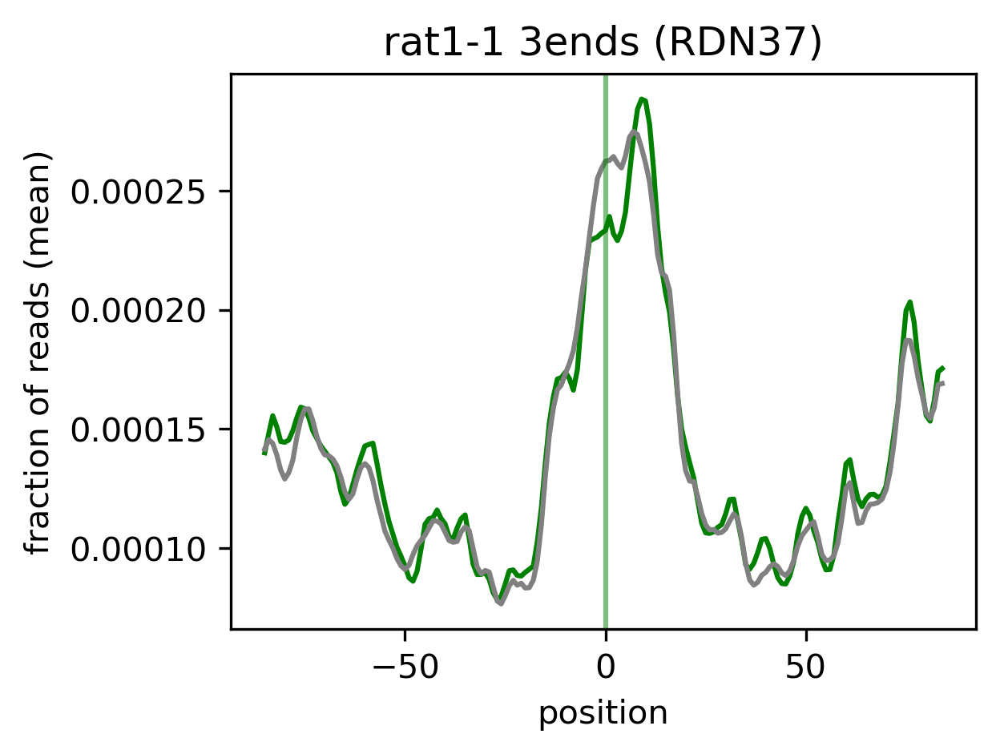

In [22]:
stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df51_Rpa190_3end_rat11_0h, df2=df52_Rpa190_3end_rat11_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="rat1-1 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R4Dmean_5ETS.png")

stop=7100
elem=" (RDN37)"

tt.plotting.cumulativePeaks(df51_Rpa190_3end_rat11_0h, df2=df52_Rpa190_3end_rat11_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="rat1-1 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R4Emean_RDN37.png")

Experiments: 
['EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_5end', 'EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_5end', 'EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_5end']
Experiments: 
['EP240806_Rpa190HTP_rat1-1_37C-2h_4_PROFILE_5end', 'EP240918_Rpa190HTP_rat1-1_37C-2h_6_PROFILE_5end', 'EP240806_Rpa190HTP_rat1-1_37C-2h_5_PROFILE_5end']


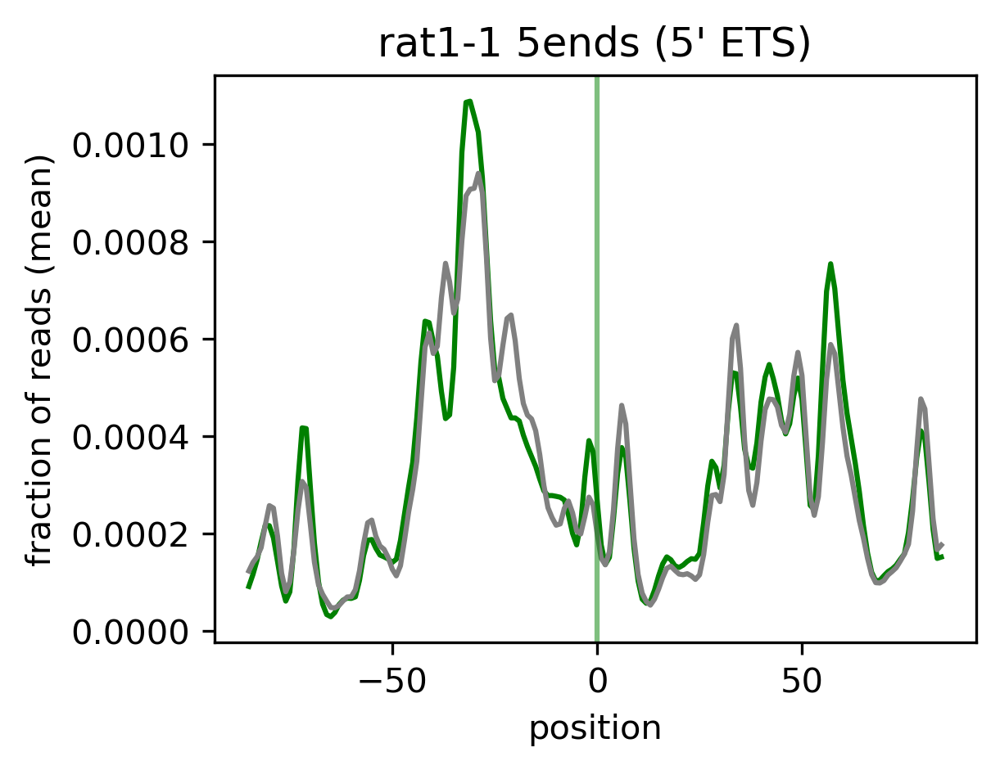

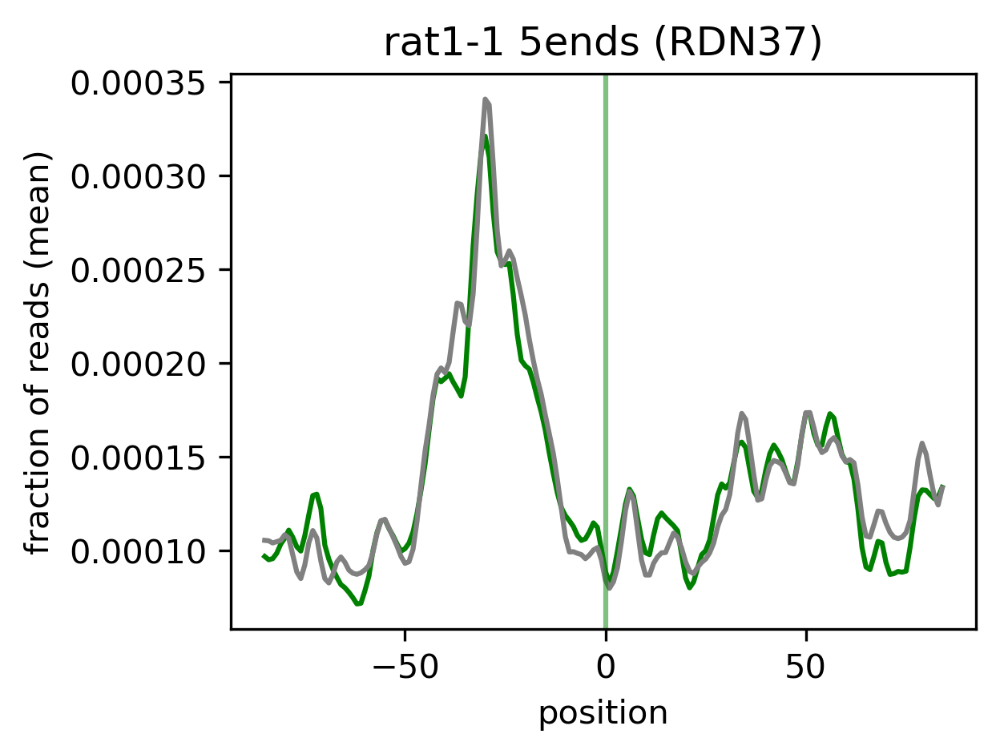

In [23]:
df53_Rpa190_5end_rat11_0h = tt.profiles.preprocess(df02_RDN37_5end,
                                     let_in=['Rpa190HTP','rat1-1','25C'],
                                     let_out=['EP2405'], stats=True)

df54_Rpa190_5end_rat11_2h = tt.profiles.preprocess(df02_RDN37_5end,
                                     let_in=['Rpa190HTP','rat1-1','37C',],
                                     let_out=['EP2405'],stats=True)

stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df53_Rpa190_5end_rat11_0h, df2=df54_Rpa190_5end_rat11_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="rat1-1 5ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R4Dmean_5ETS.png")

stop=7100
elem=" (RDN37)"

tt.plotting.cumulativePeaks(df53_Rpa190_5end_rat11_0h, df2=df54_Rpa190_5end_rat11_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="rat1-1 5ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R4Emean_RDN37.png")

Experiments: 
['EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end', 'EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end', 'EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end']
Experiments: 
['EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end_polyA', 'EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end_polyA', 'EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end_polyA']
Experiments: 
['EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end', 'EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end', 'EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end']
Fraxction of polyA reads in the dataset:
EP240806_Rpa190HTP_rat1-1_25C_5_PROFILE_3end    0.014127
EP240806_Rpa190HTP_rat1-1_25C_4_PROFILE_3end    0.016116
EP240918_Rpa190HTP_rat1-1_25C_6_PROFILE_3end    0.004860
dtype: float64
Experiments: 
['EP240806_Rpa190HTP_rat1-1_37C-2h_4_PROFILE_3end', 'EP240918_Rpa190HTP_rat1-1_37C-2h_6_PROFILE_3end', 'EP240806_Rpa190HTP_rat1-1_37C-2h_5_PROFILE_3end']
Experiments: 
['EP240918_Rpa190HTP_rat1-1_37C-2h_6_PROFILE_3end_polyA', 'EP240806_Rpa190HTP_rat1-1_37C-2h_4_PR

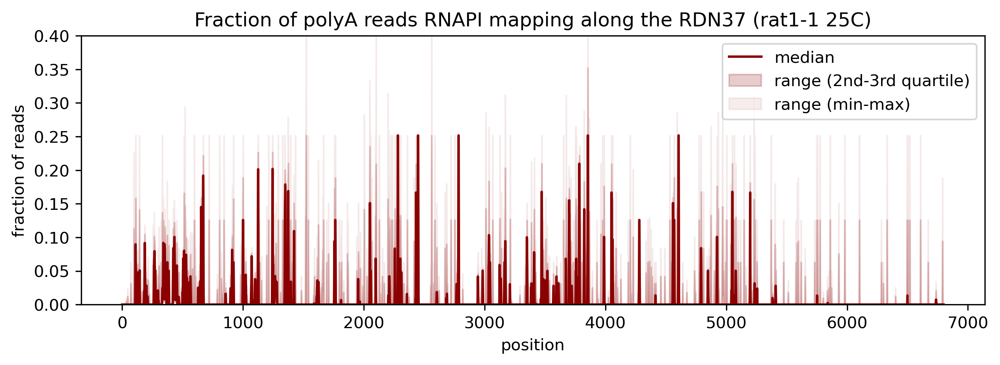

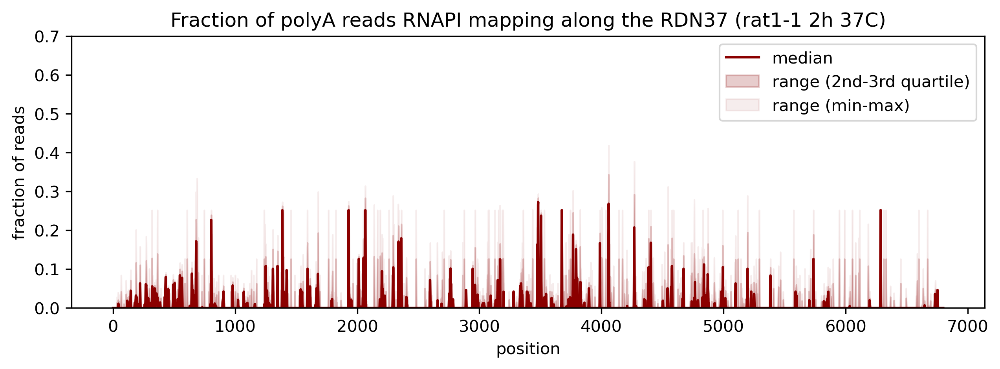

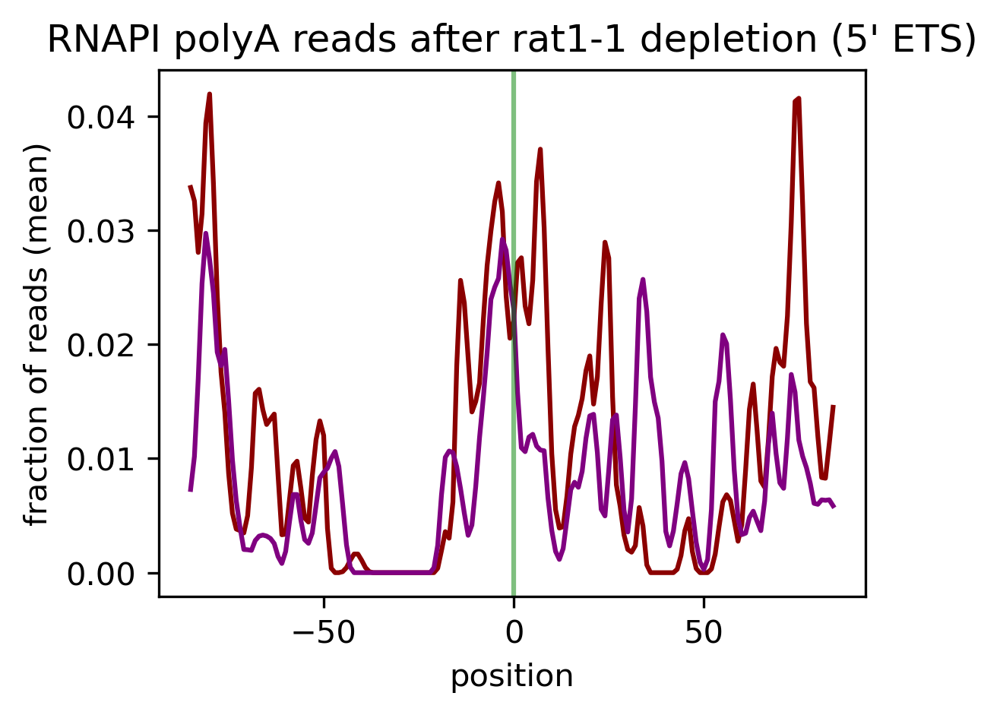

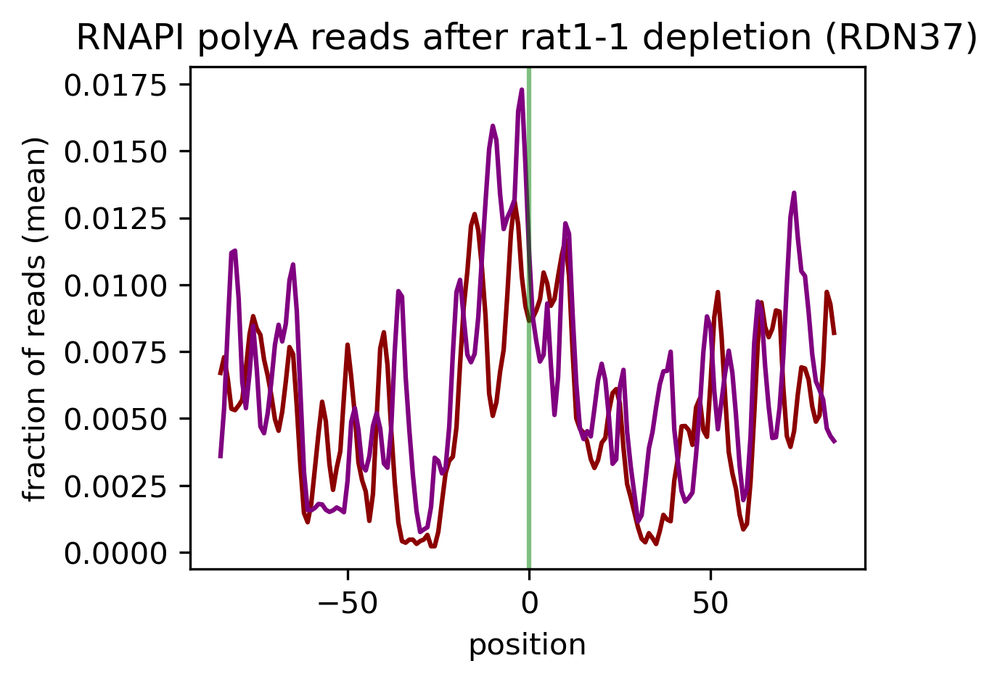

In [24]:
df53_Rpa190_3end_rat11_0h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','rat1-1','25C'],
                                let_out=['EP2405'], count=False)

df54_Rpa190_3end_rat11_2h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','rat1-1','37C'],
                                let_out=['EP2405'], count=False)


tt.plotting.plot_as_box_plot(df53_Rpa190_3end_rat11_0h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (rat1-1 25C)",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df54_Rpa190_3end_rat11_2h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (rat1-1 2h 37C)",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df53_Rpa190_3end_rat11_0h_polyA, df2=df54_Rpa190_3end_rat11_2h_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI polyA reads after rat1-1 depletion"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='darkred', color2="purple", lc='green',fname="Fig_R4Fmean_5ETS.png")

stop=7100
elem=" (RDN37)"

tt.plotting.cumulativePeaks(df53_Rpa190_3end_rat11_0h_polyA, df2=df54_Rpa190_3end_rat11_2h_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="RNAPI polyA reads after rat1-1 depletion"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='darkred', color2="purple", lc='green',fname="Fig_R4Gmean_RDN37.png")

# air1d-air2d

In [25]:
df01_RDN37_3end.filter(like='air1').sum().sort_values(ascending=False)

seq9-EP240926_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end    144545.0
EP240806_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end         103879.0
EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end             75762.0
seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end        25297.0
dtype: float64

Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end', 'EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end']
Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end', 'EP240806_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end']


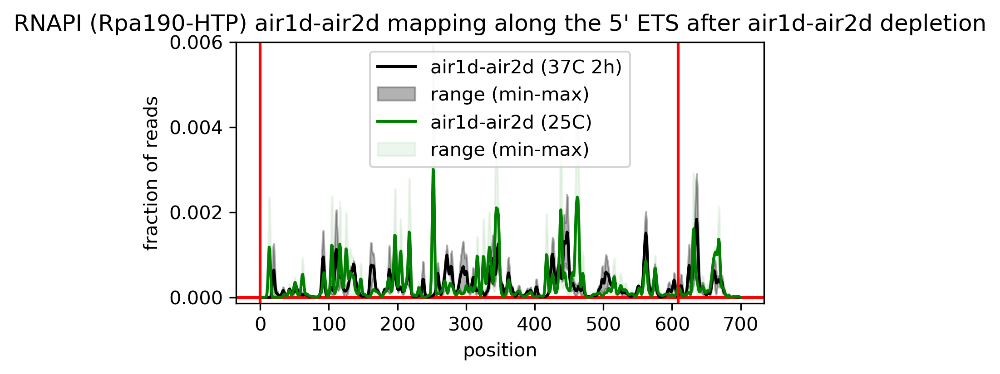

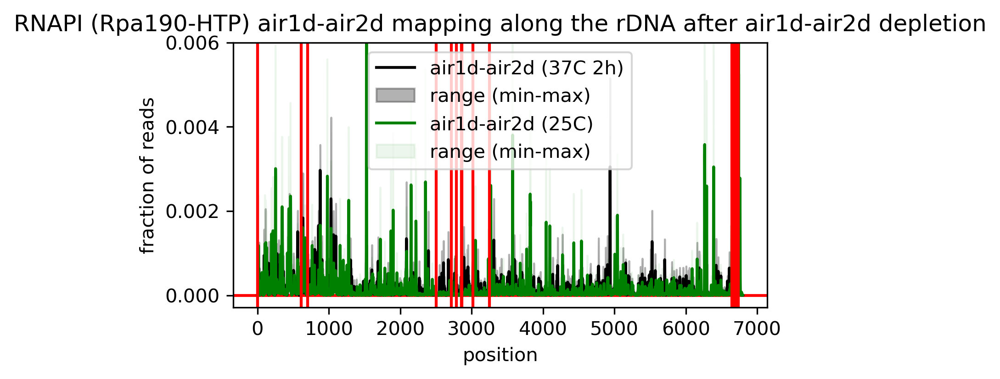

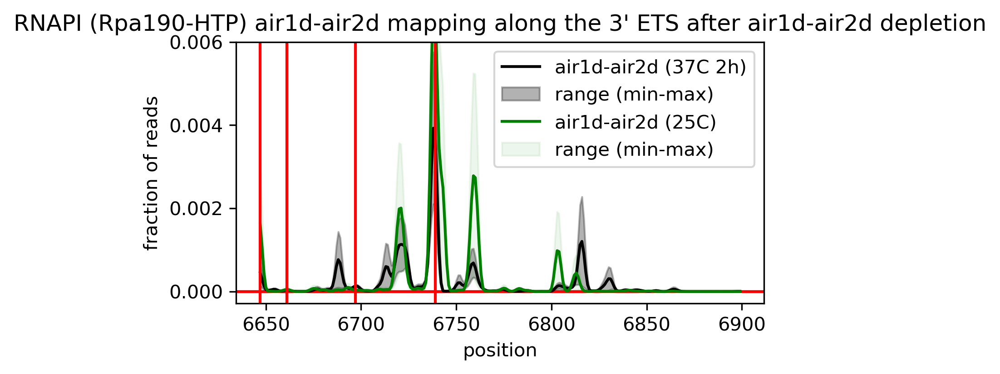

In [26]:
df61_Rpa190_3end_air1d_air2d_0h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','air1','25C'],stats=True)

df62_Rpa190_3end_air1d_air2d_2h = tt.profiles.preprocess(df01_RDN37_3end,
                                     let_in=['Rpa190HTP','air1','37C'],stats=True)

tt.plotting.plot_to_compare(ref=df61_Rpa190_3end_air1d_air2d_0h, df=df62_Rpa190_3end_air1d_air2d_2h,figsize=(5,2.5),ref_label="air1d-air2d (25C)",label="air1d-air2d (37C 2h)",
                           title="RNAPI (Rpa190-HTP) air1d-air2d mapping along the 5' ETS after air1d-air2d depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=0+300, stop=700+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R5A-5ETS.png')

tt.plotting.plot_to_compare(ref=df61_Rpa190_3end_air1d_air2d_0h, df=df62_Rpa190_3end_air1d_air2d_2h,figsize=(5,2.5),ref_label="air1d-air2d (25C)",label="air1d-air2d (37C 2h)",
                           title="RNAPI (Rpa190-HTP) air1d-air2d mapping along the rDNA after air1d-air2d depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=0+300, stop=6800+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R5B-RDN37.png')

tt.plotting.plot_to_compare(ref=df61_Rpa190_3end_air1d_air2d_0h, df=df62_Rpa190_3end_air1d_air2d_2h,figsize=(5,2.5),ref_label="air1d-air2d (25C)",label="air1d-air2d (37C 2h)",
                           title="RNAPI (Rpa190-HTP) air1d-air2d mapping along the 3' ETS after air1d-air2d depletion",
                           dpi=300,offset=300, ylim=(None,0.006),
                           start=6647+300, stop=6900+300,
                           h_lines=[i-300 for i in cleavage_sites.values()],
                           fname='Fig_R5C-3ETS.png')

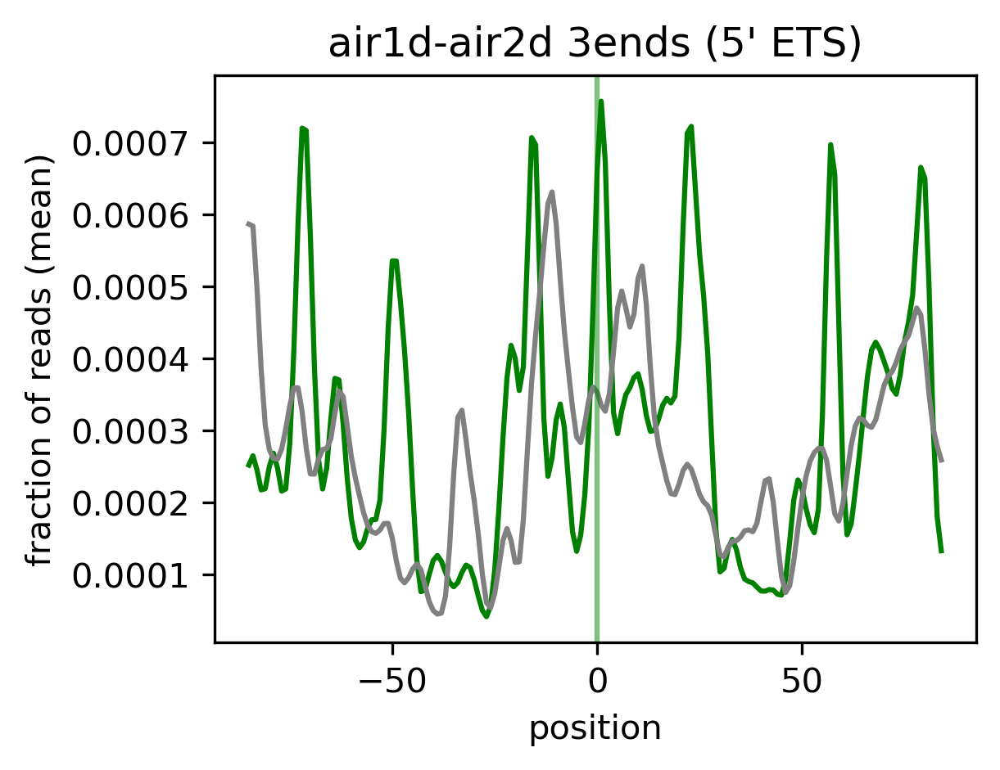

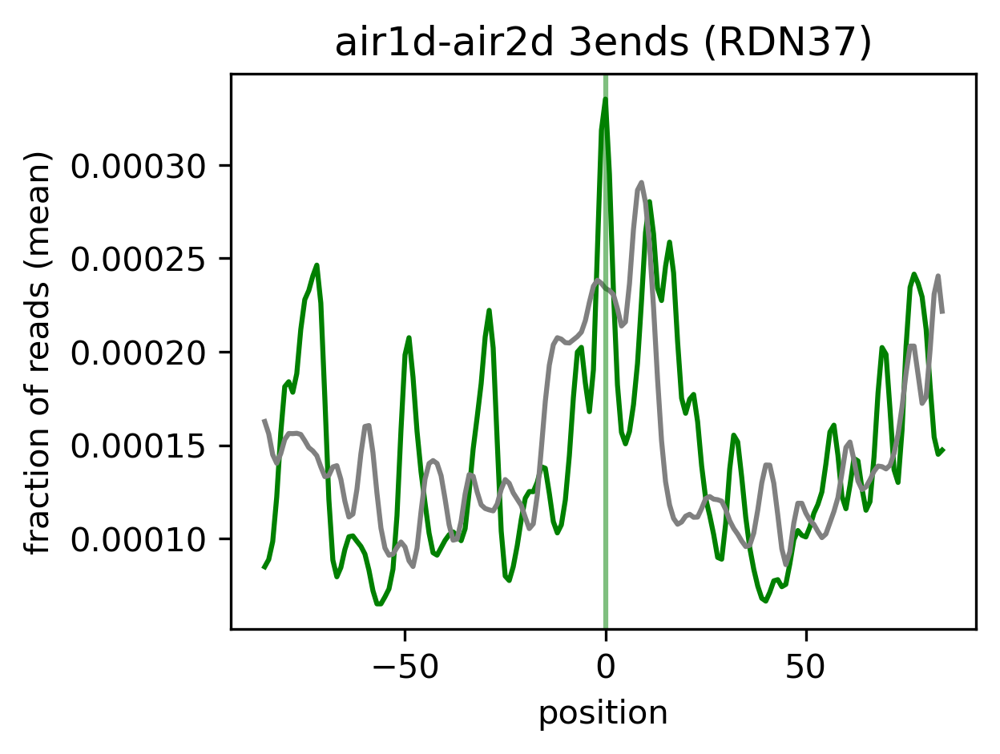

In [27]:
stop=1000
window = 85
elem=" (5' ETS)"

tt.plotting.cumulativePeaks(df61_Rpa190_3end_air1d_air2d_0h, df2=df62_Rpa190_3end_air1d_air2d_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="air1d-air2d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R5Dmean_5ETS.png")

stop=7100
elem=" (RDN37)"

tt.plotting.cumulativePeaks(df61_Rpa190_3end_air1d_air2d_0h, df2=df62_Rpa190_3end_air1d_air2d_2h, local_pos=[i for i in peaks if i != 643], dpi=300,
                        title="air1d-air2d 3ends"+elem, start=None, stop=stop, window=window, figsize=(4,3),
                        color1='green', color2="grey", lc='green',fname="Fig_R5Emean_RDN37.png")

Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end', 'EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end']
Experiments: 
['EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end_polyA', 'seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end_polyA']
Experiments: 
['EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end', 'seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end']
Fraxction of polyA reads in the dataset:
EP240806_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end         0.004884
seq9-EP240926_Rpa190HTP_air1d-air2d_25C_1_PROFILE_3end    0.002372
dtype: float64
Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end', 'EP240806_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end']
Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end_polyA', 'EP240806_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end_polyA']
Experiments: 
['seq9-EP240926_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end', 'EP240806_Rpa190HTP_air1d-air2d_37C-2h_2_PROFILE_3end']
Fraxction of

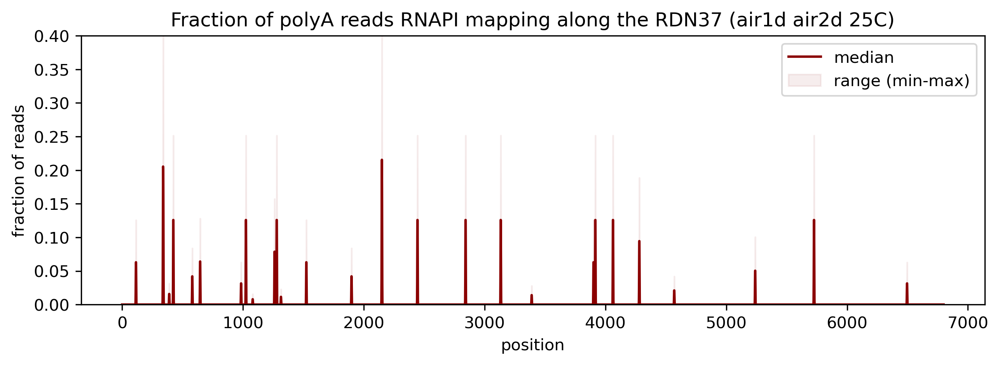

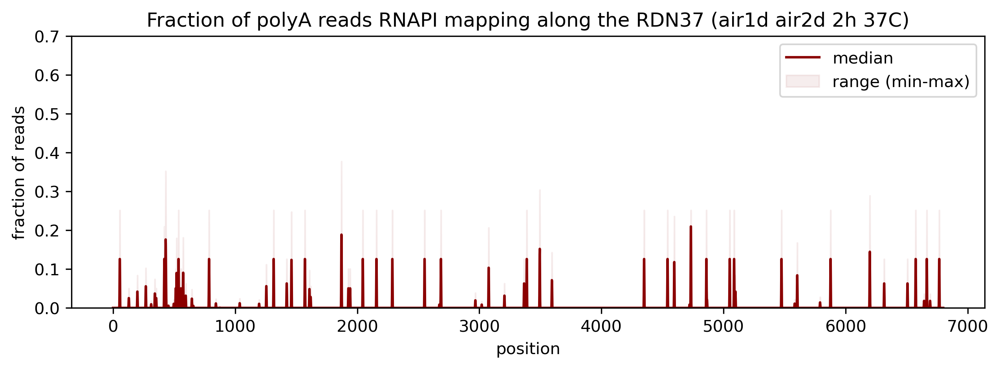

In [28]:
df63_Rpa190_3end_air1d_air2d_0h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','air1','25C'], count=False)

df64_Rpa190_3end_air1d_air2d_2h_polyA = polyA_reads(df_raw_all=df01_RDN37_3end, df_raw_polyA=df03_RDN37_polyA,
                                let_in=['Rpa190HTP','air1','37C'], count=False)


tt.plotting.plot_as_box_plot(df63_Rpa190_3end_air1d_air2d_0h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (air1d air2d 25C)",
                             dpi=300,ylim=(None,0.4), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

tt.plotting.plot_as_box_plot(df64_Rpa190_3end_air1d_air2d_2h_polyA, title="Fraction of polyA reads RNAPI mapping along the RDN37 (air1d air2d 2h 37C)",
                             dpi=300,ylim=(None,0.7), start=0+300, stop=6800+300,color='darkred',figsize=(10,3),
                             offset=300)

# stop=1000
# window = 85
# elem=" (5' ETS)"

# tt.plotting.cumulativePeaks(df63_Rpa190_3end_air1d_air2d_0h_polyA, df2=df64_Rpa190_3end_air1d_air2d_2h_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="RNAPI polyA reads after air1d air2d depletion"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='darkred', color2="purple", lc='green',fname="Fig_R5Fmean_5ETS.png")

# stop=7100
# elem=" (RDN37)"

# tt.plotting.cumulativePeaks(df63_Rpa190_3end_air1d_air2d_0h_polyA, df2=df64_Rpa190_3end_air1d_air2d_2h_polyA, local_pos=[i for i in peaks if i != 643], dpi=300,
#                         title="RNAPI polyA reads after air1d air2d depletion"+elem, start=None, stop=stop, window=window, figsize=(4,3),
#                         color1='darkred', color2="purple", lc='green',fname="Fig_R5Gmean_RDN37.png")